In [1]:
import pandas as pd
import numpy as np

In [2]:
# cd /home/anshul/Desktop/Data_Science_Project/dataset/NTU_DATA
import os
os.chdir('/home/ubuntu/NTU_DATA')

!pwd

/home/ubuntu/NTU_DATA


## PAAD - TF integration analysis

In [3]:
PAAD_gene_expression_levels = pd.read_csv('Gene-Expression-Levels/TOIL_RSEM_TPM_PAAD.csv', low_memory=False)
PAAD_gene_expression_levels

,Unnamed: 0,HGNC_symbol,TCGA_HZ_7922,TCGA_Q3_A5QY,TCGA_FB_A545,TCGA_RL_AAAS,TCGA_F2_7276,TCGA_FB_A7DR,TCGA_YB_A89D,TCGA_IB_7889,...,TCGA_LB_A9Q5,TCGA_IB_A5SO,TCGA_LB_A7SX,TCGA_HV_AA8X,TCGA_HZ_A77O,TCGA_IB_AAUN,TCGA_HZ_7918,TCGA_2L_AAQI,TCGA_2J_AABK,TCGA_IB_7885
0,ENSG00000000003,TSPAN6,5.3615,3.1311,4.2533,4.7121,4.9814,4.0109,4.2389,4.4463,...,3.5473,3.9847,4.6154,4.1978,3.9384,4.4330,4.9892,4.8595,4.1970,4.3435
1,ENSG00000000005,TNMD,-5.5735,1.9931,-9.9658,-2.6349,-2.2447,-3.3076,-3.6259,-4.6082,...,-5.5735,-3.4580,-4.0350,-9.9658,-9.9658,-3.6259,-9.9658,-9.9658,-5.5735,-1.6394
2,ENSG00000000419,DPM1,5.8020,4.6770,5.4627,4.8167,5.2969,5.4019,5.3674,4.9919,...,4.1490,4.9787,5.4624,5.2954,4.9317,5.4835,5.6476,5.2056,4.6148,5.1248
3,ENSG00000000457,SCYL3,3.3577,1.8444,2.4544,2.4623,2.8280,2.4623,2.2391,2.3732,...,1.3901,2.2573,2.6395,3.6042,1.9601,2.3423,2.6325,2.6138,3.0927,2.2633
4,ENSG00000000460,FIRRM,1.8762,1.0711,2.1313,0.8082,1.3679,1.5950,1.4600,1.1117,...,0.6425,1.4547,1.9859,2.3871,1.5366,1.6327,1.6327,1.9377,1.6830,1.8879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56399,ENSG00000282798,NaN,-2.3884,-2.1140,-1.1172,-1.8314,-1.7809,-2.4659,-1.8836,-9.9658,...,-3.3076,-0.1345,-0.8084,-3.0469,-2.0529,-2.1140,-2.8262,-3.3076,-0.9971,-1.8836
56400,ENSG00000282804,NaN,-9.9658,-9.9658,-9.9658,-9.9658,-4.2934,-9.9658,-9.9658,-5.0116,...,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-4.6082,-9.9658,-9.9658,-9.9658
56401,ENSG00000282807,NaN,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,...,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658
56402,ENSG00000282815,TEX13C,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,...,-9.9658,-9.9658,0.2029,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658,-9.9658


In [4]:
TFT_gene_attribution = pd.read_csv('Transcription-Factor-Target/gene_attribute_edges.txt', sep='\t', low_memory=False)

In [5]:
TFT_df = TFT_gene_attribution[TFT_gene_attribution['source'] == 'MIR100HG']
TF_MIR100HG_list = TFT_df["target"]

In [6]:
PAAD_TF_expressions = PAAD_gene_expression_levels[PAAD_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
PAAD_TF_expressions.shape

(56, 180)

In [7]:
def extract_high_low_MIR100HG(expressions_df):
    MIR100HG_values = expressions_df[expressions_df['HGNC_symbol'] == 'MIR100HG']
    MIR100HG_values = MIR100HG_values.iloc[:, 2:].apply(pd.to_numeric, errors='coerce')
    median_MIR100HG = MIR100HG_values.iloc[0].median()
    high_low_MIR100HG = pd.DataFrame(columns=['Patient', 'Gene Expression Value', 'MIR100HG Level'])
    
    for i, j in zip(MIR100HG_values, MIR100HG_values.iloc[0]):
        row_index = len(high_low_MIR100HG)
        high_low_MIR100HG.at[row_index, 'Patient'] = i
        high_low_MIR100HG.loc[row_index, 'Gene Expression Value'] = j
        high_low_MIR100HG.loc[row_index, 'MIR100HG Level'] = 'High' if j > median_MIR100HG else 'Low'
    
    high_MIR100HG = high_low_MIR100HG[high_low_MIR100HG['MIR100HG Level'] == 'High']
    low_MIR100HG = high_low_MIR100HG[high_low_MIR100HG['MIR100HG Level'] == 'Low']
    
    high_MIR100HG_series = high_MIR100HG["Patient"]
    low_MIR100HG_series = low_MIR100HG["Patient"]

    return (high_MIR100HG_series, low_MIR100HG_series)

In [8]:
PAAD_high_MIR100HG_series, PAAD_low_MIR100HG_series = extract_high_low_MIR100HG(PAAD_gene_expression_levels)

In [9]:
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

def detf_extraction(expression_levels, high_MIR100HG_series, low_MIR100HG_series):
    results = []
    
    expression_levels_ttest = expression_levels.dropna(subset=["HGNC_symbol"])
    hgnc_symbol_list = expression_levels_ttest["HGNC_symbol"]
    expression_levels_ttest = expression_levels_ttest.drop(columns=["HGNC_symbol"])
    for ensembl_id, hgnc_symbol in zip(expression_levels_ttest.index, hgnc_symbol_list):
        if ensembl_id == "ENSG00000255248":
            continue
    
        high_expr = expression_levels_ttest.loc[ensembl_id, high_MIR100HG_series]
        low_expr = expression_levels_ttest.loc[ensembl_id, low_MIR100HG_series]
    
        high_expr = pd.to_numeric(high_expr, errors='coerce')
        low_expr = pd.to_numeric(low_expr, errors='coerce')
    
        high_expr = high_expr.dropna()
        low_expr = low_expr.dropna()

        
        variance_threshold = 0.1
        if len(high_expr) > 1 and len(low_expr) > 1:
            if high_expr.std() > variance_threshold and low_expr.std() > variance_threshold:
                stat, p_value = ttest_ind(high_expr, low_expr, equal_var=False)
                results.append([ensembl_id, hgnc_symbol, stat, p_value])
    
    results_df = pd.DataFrame(results, columns=["Ensembl_id", "HGNC_symbol", "T-statistic", "P-value"])

    return results_df


In [10]:
PAAD_results_df = detf_extraction(PAAD_TF_expressions, PAAD_high_MIR100HG_series, PAAD_low_MIR100HG_series)

In [11]:
PAAD_results_df["Adjusted P-value"] = multipletests(PAAD_results_df["P-value"], method="fdr_bh")[1]

PAAD_results_df["Adjusted P-value"] = pd.to_numeric(PAAD_results_df["Adjusted P-value"], errors="coerce")

PAAD_results_df = PAAD_results_df.sort_values(by="Adjusted P-value", ascending=True)

PAAD_significant_detfs = PAAD_results_df[(PAAD_results_df["Adjusted P-value"] < 0.01)]

PAAD_significant_detfs = PAAD_significant_detfs.sort_values(by="T-statistic", ascending=False)

PAAD_significant_detfs.head(20), PAAD_significant_detfs.shape

(    Ensembl_id HGNC_symbol  T-statistic       P-value  Adjusted P-value
 40       12003        PBX3     8.744974  2.971108e-15      1.663820e-13
 18        4198       NR3C1     7.187972  4.500282e-11      1.260079e-09
 41       12387       STAT3     6.388225  1.714633e-09      3.200649e-08
 33        7922       TCF12     6.312535  2.814136e-09      3.939791e-08
 27        6033       FOXP2     5.715449  5.064468e-08      5.672204e-07
 37        9957       BACH1     5.545568  1.175461e-07      1.097097e-06
 17        4081         TBP     5.438080  2.361874e-07      1.889499e-06
 19        4507        ATF2     5.333006  3.711452e-07      2.598016e-06
 5         1309       FOSL2     5.079151  9.901764e-07      6.161098e-06
 8         2293       EP300     4.887317  2.486207e-06      1.392276e-05
 34        8377        RFX5     4.802341  3.905827e-06      1.988421e-05
 6         1621        REST     4.748149  4.367156e-06      2.038006e-05
 48       14648       GATA2     4.706848  5.264306e

In [12]:
PAAD_top_detfs = PAAD_significant_detfs[(PAAD_significant_detfs["Adjusted P-value"] < 1e-4) & (PAAD_significant_detfs["T-statistic"] > 7)].head(200)

PAAD_top_detfs = PAAD_top_detfs.sort_values(by="T-statistic", ascending=False)

PAAD_top_detfs.head(20), PAAD_top_detfs.shape

(    Ensembl_id HGNC_symbol  T-statistic       P-value  Adjusted P-value
 40       12003        PBX3     8.744974  2.971108e-15      1.663820e-13
 18        4198       NR3C1     7.187972  4.500282e-11      1.260079e-09,
 (2, 5))

In [13]:
TFs_target_df = TFT_gene_attribution[["source", "target"]]
TFs_target_df.shape

(1655384, 2)

In [14]:
def read_degs(file_path, priority='Top'):
    deg_df = pd.read_csv(file_path)
    significant_degs = deg_df[(deg_df["Adjusted P-value"] < 0.01)]
    significant_degs = significant_degs.sort_values(by="T-statistic", ascending=False)
    significant_genes = significant_degs["HGNC_symbol"]
    if priority == "Top":
        upregulated_degs = significant_degs.sort_values(by='T-statistic', ascending=False).head(100)
        downregulated_degs = significant_degs.sort_values(by='T-statistic').head(100)
        top_degs = pd.concat([upregulated_degs, downregulated_degs])
        top_genes = top_degs["HGNC_symbol"]
        return top_degs

    return significant_genes

In [15]:
PAAD_top_degs = read_degs("../project/dsmp-2024-groupm22/files/PAAD_results.csv")

In [16]:
def map_defts_targets(significant_detfs, top_degs):
    significant_TFs_target_dict = dict()

    for detf in PAAD_significant_detfs['HGNC_symbol']:
        target_list = list(TFT_gene_attribution[TFT_gene_attribution['target'] == detf]["source"])
        significant_TFs_target_dict.update({detf: target_list})

    for detf, target_list in significant_TFs_target_dict.items():
        target_list = list(set(target_list).intersection(set(top_degs['HGNC_symbol'])))
        significant_TFs_target_dict[detf] = target_list

    return significant_TFs_target_dict


In [17]:
PAAD_detfs_target_dict = map_defts_targets(PAAD_significant_detfs, PAAD_top_degs)
print(PAAD_detfs_target_dict)

{'PBX3': ['MXRA7', 'COMTD1', 'MFSD3', 'ZCCHC24', 'FBXL7', 'KREMEN2', 'FBLN5', 'ADAT3', 'GPRC5C', 'ETV4', 'POLD2', 'GLTPD2', 'ZEB2', 'GAK', 'CCDC80', 'TCEAL7', 'OLFML3', 'VSTM4', 'OTX1', 'RECQL4', 'FOXH1', 'ZNF524', 'CAMSAP3', 'CALD1', 'UQCC3', 'PAM16', 'NOXA1', 'EPB41L2', 'CNN3', 'MRPL23', 'TMEM184A', 'ASPN', 'EXTL2', 'SLC25A10', 'PRICKLE2', 'BNC2', 'TPRN', 'NEGR1', 'DNM3OS', 'MIF', 'RHOJ', 'SCAND1', 'ENDOG', 'FKBP7', 'TMEM238', 'DUS1L', 'ZNF521', 'DKK3', 'ZNF787', 'CDT1', 'FERMT2', 'SLC9A9', 'RBMS3', 'AP1S2', 'KRTCAP2', 'PRR7', 'SGCD', 'RPL18', 'CNRIP1', 'TSTD1', 'RASSF8', 'DDR2', 'NOC4L', 'CHTF18', 'SLC25A39', 'MFAP4', 'ZEB1', 'CRACR2B', 'THY1', 'RPS15', 'CLIC4', 'TONSL', 'TIMM13', 'TLCD1', 'REEP6', 'PDF', 'CREM', 'DLC1', 'TMUB1', 'GCAT', 'ZDHHC12', 'LLGL2', 'CEP72', 'SCRIB', 'RHPN1', 'ZNF296', 'GAS5', 'BEND6'], 'NR3C1': ['SPARCL1', 'CRACR2B', 'COMTD1', 'ZNF524', 'COL14A1', 'ZNF787', 'MFSD3', 'CLIC4', 'CALD1', 'NOXA1', 'EFNA3', 'NR2F6', 'ADAT3', 'GPRC5C', 'AGPAT2', 'NCLN', 'RBMS3', '

In [18]:
PAAD_expressions_df = PAAD_gene_expression_levels.drop(columns=["Unnamed: 0"])
PAAD_expressions_df = PAAD_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")

In [19]:
def calculate_correlation(tf, target, expressions_df):
    if tf in expressions_df.index and target in expressions_df.index:
        tf_expr = expressions_df.loc[tf].astype(float)
        target_expr = expressions_df.loc[target].astype(float)
        corr_coef = np.corrcoef(tf_expr, target_expr)[0, 1]
        return corr_coef
    else:
        return None

def get_correlation_df(tf_target_dict, expressions_df):
    correlation_results = []
    for tf, targets in tf_target_dict.items():
        for target in targets:
            correlation = calculate_correlation(tf, target, expressions_df)
            if correlation is not None:
                correlation_results.append({"TF": tf, "Target": target, "Correlation": correlation})

    correlation_df = pd.DataFrame(correlation_results)
    
    return correlation_df


In [20]:
PAAD_correlation_df = get_correlation_df(PAAD_detfs_target_dict, PAAD_expressions_df)
PAAD_correlation_df

,TF,Target,Correlation
0,PBX3,MXRA7,0.759889
1,PBX3,COMTD1,-0.312838
2,PBX3,MFSD3,-0.165160
3,PBX3,ZCCHC24,0.476446
4,PBX3,FBXL7,0.572783
...,...,...,...
3739,CHD2,ZNF296,0.172443
3740,CHD2,GAS5,0.077912
3741,CHD2,KANK2,0.415150
3742,CHD2,SLC39A4,0.075617


In [21]:
PAAD_strong_corr_df = PAAD_correlation_df[PAAD_correlation_df["Correlation"].abs() > 0.5]
PAAD_strong_corr_df

,TF,Target,Correlation
0,PBX3,MXRA7,0.759889
4,PBX3,FBXL7,0.572783
6,PBX3,FBLN5,0.538381
12,PBX3,ZEB2,0.569433
15,PBX3,TCEAL7,0.510917
...,...,...,...
3652,CHD2,EPB41L2,0.532985
3661,CHD2,DIXDC1,0.505973
3675,CHD2,SH3BGRL,0.588476
3681,CHD2,PLSCR4,0.545557


In [22]:
import networkx as nx
import matplotlib.pyplot as plt

def create_regulatory_network(strong_corr_df, significant_detfs, keyword):
    G = nx.DiGraph()
    
    for idx, row in strong_corr_df.iterrows():
        tf = row["TF"]
        target = row["Target"]
        corr = row["Correlation"]
        G.add_edge(tf, target, weight=corr)
    
    print(f"{keyword} Network has {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")
    
    centrality = nx.degree_centrality(G)
    hub_tfs = sorted(((node, cent) for node, cent in centrality.items() if node in significant_detfs),
                     key=lambda x: x[1], reverse=True)
    print("Top hub TFs:", hub_tfs[:10])
    
    tf_nodes = [node for node in G.nodes() if node in significant_detfs]
    target_nodes = [node for node in G.nodes() if node not in significant_detfs]
    
    node_colors = []
    for node in G.nodes():
        if node in significant_detfs:
            node_colors.append('lightgreen')
        else:
            node_colors.append('lightblue')
    
    plt.figure(figsize=(15, 15))
    pos = nx.spring_layout(G, k=0.5)
    
    nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors)
    nx.draw_networkx_edges(G, pos, width=1, alpha=0.7)
    nx.draw_networkx_labels(G, pos, font_size=8)
    
    # plt.title(f"{keyword} Regulatory Network of TFs and DEGs (Strong Correlations)")
    plt.axis('off')
    plt.savefig(f"../project/dsmp-2024-groupm22/plots/{keyword}_regulatory_network_plot.png", dpi=300, bbox_inches='tight')
    plt.show()


PAAD Network has 119 nodes and 748 edges.
Top hub TFs: [('EP300', 0.5254237288135594), ('POLR2A', 0.4745762711864407), ('STAT3', 0.4576271186440678), ('TCF12', 0.4576271186440678), ('SIN3A', 0.4152542372881356), ('FOXP2', 0.3135593220338983), ('BACH1', 0.3135593220338983), ('REST', 0.3050847457627119), ('SMC3', 0.288135593220339), ('RFX5', 0.2711864406779661)]


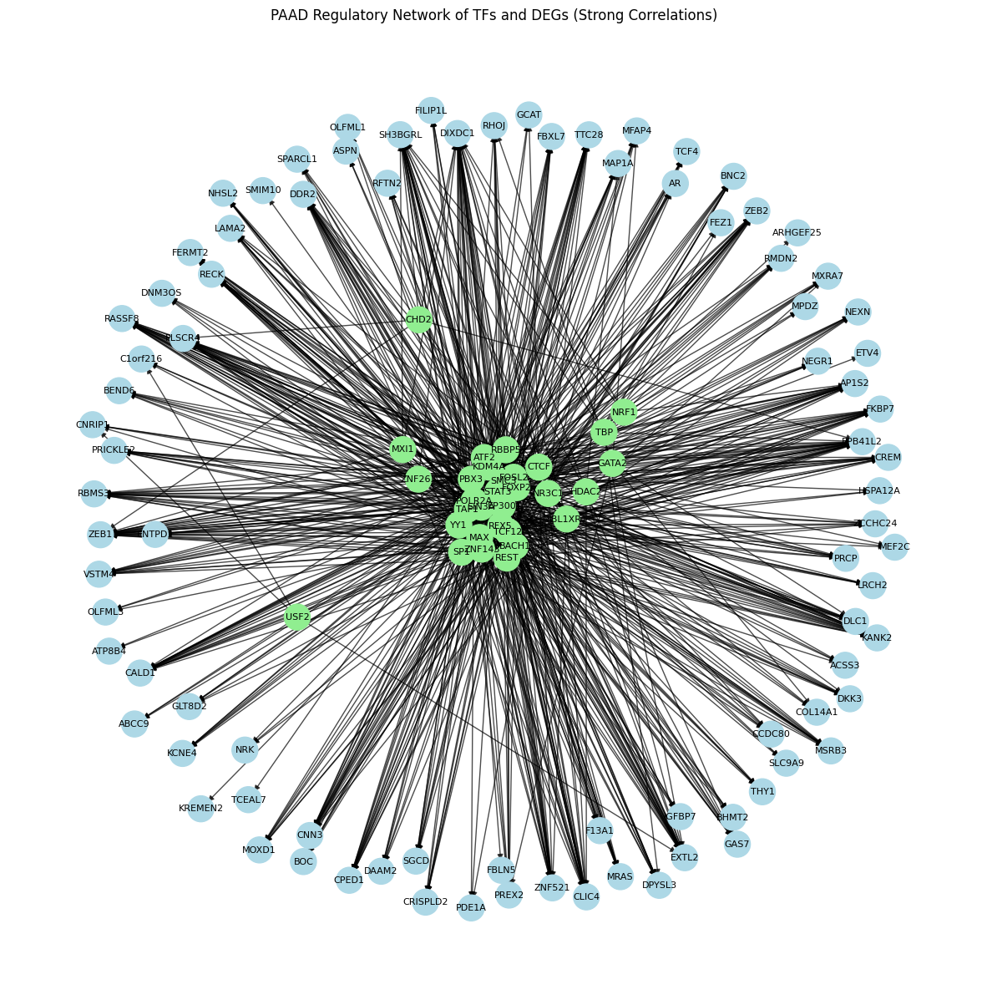

In [23]:
create_regulatory_network(PAAD_strong_corr_df, list(PAAD_significant_detfs['HGNC_symbol']), "PAAD")

## SKCM - TF integration analysis

In [24]:
SKCM_gene_expression_levels = pd.read_csv('Gene-Expression-Levels/TOIL_RSEM_TPM_SKCM.csv', low_memory=False)

In [25]:
SKCM_TF_expressions = SKCM_gene_expression_levels[SKCM_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
SKCM_TF_expressions.shape

(56, 104)

In [26]:
SKCM_high_MIR100HG_series, SKCM_low_MIR100HG_series = extract_high_low_MIR100HG(SKCM_gene_expression_levels)

In [27]:
SKCM_results_df = detf_extraction(SKCM_TF_expressions, SKCM_high_MIR100HG_series, SKCM_low_MIR100HG_series)

In [28]:
SKCM_results_df["Adjusted P-value"] = multipletests(SKCM_results_df["P-value"], method="fdr_bh")[1]

SKCM_results_df["Adjusted P-value"] = pd.to_numeric(SKCM_results_df["Adjusted P-value"], errors="coerce")

SKCM_results_df = SKCM_results_df.sort_values(by="Adjusted P-value", ascending=True)

SKCM_significant_detfs = SKCM_results_df[(SKCM_results_df["Adjusted P-value"] < 0.01)]

SKCM_significant_detfs = SKCM_significant_detfs.sort_values(by="T-statistic", ascending=False)

SKCM_significant_detfs.head(20), SKCM_significant_detfs.shape

(    Ensembl_id HGNC_symbol  T-statistic       P-value  Adjusted P-value
 33        7922       TCF12     5.854132  8.781826e-08          0.000002
 18        4198       NR3C1     5.845320  7.871432e-08          0.000002
 37        9957       BACH1     5.384262  5.457134e-07          0.000010
 50       15989         SP1     5.151604  1.416089e-06          0.000020
 6         1621        REST     4.884757  5.434621e-06          0.000054
 46       13526        CHD2     4.858344  5.784398e-06          0.000054
 10        2734        CTCF     4.721149  9.289288e-06          0.000074
 39       11858      ZNF143     4.445507  3.005716e-05          0.000169
 19        4507        ATF2     4.407358  3.005693e-05          0.000169
 38       11425       RAD21     4.399765  3.017381e-05          0.000169
 35        8922        TAF1     4.376157  3.507319e-05          0.000179
 9         2386         YY1     4.198604  7.126785e-05          0.000317
 41       12387       STAT3     4.166096  7.348310e

In [29]:
SKCM_top_detfs = SKCM_significant_detfs[(SKCM_significant_detfs["Adjusted P-value"] < 1e-4) & (SKCM_significant_detfs["T-statistic"] > 7)].head(200)

SKCM_top_detfs = SKCM_top_detfs.sort_values(by="T-statistic", ascending=False)

SKCM_top_detfs.head(20), SKCM_top_detfs.shape

(Empty DataFrame
 Columns: [Ensembl_id, HGNC_symbol, T-statistic, P-value, Adjusted P-value]
 Index: [],
 (0, 5))

In [30]:
SKCM_top_degs = read_degs("../project/dsmp-2024-groupm22/files/SKCM_results.csv")

In [31]:
SKCM_detfs_target_dict = map_defts_targets(SKCM_significant_detfs, SKCM_top_degs)
print(SKCM_detfs_target_dict)

{'PBX3': ['FOXO1', 'CYB5D1', 'MRPS2', 'PIK3CD', 'RUNX3', 'AURKAIP1', 'ZEB1', 'NAPEPLD', 'MAD1L1', 'MFSD12', 'NEDD4L', 'MRPL41', 'SPRY4', 'TRIM9', 'MBTPS1', 'COMTD1', 'ASB13', 'MGAT5B', 'FUT8', 'FLRT1', 'TXNDC15', 'FRMD6', 'POSTN', 'GYPC', 'UPP1', 'GSTP1', 'MGP', 'NR4A3', 'UQCRC1', 'SLC35A1', 'ZEB1-AS1', 'KREMEN2', 'SNX22', 'ATP6V0B', 'PHLDB1', 'RBMS3', 'AVPI1', 'SORL1', 'ANKRD39', 'XYLT1', 'ARRDC3', 'GNG2', 'MRPL12', 'ALDH1A1', 'FREM2', 'KCNAB2', 'ABCD1', 'SNX1', 'CYB561A3', 'SLC16A6', 'NECAB3', 'RHOJ', 'TSPYL2', 'RAB3A', 'IL6ST', 'WIPI1', 'LGI4', 'SLC7A5', 'DCHS1', 'PKMYT1', 'MAST1', 'TANGO2', 'ARL15', 'ARSG', 'ATP6V0C', 'SPPL2B', 'ARHGEF6', 'SFRP1', 'ZNF397', 'DUS1L', 'WNK4', 'ANGPT2', 'SLC25A39', 'SLC45A2'], 'NR3C1': ['MRPS2', 'AURKAIP1', 'MAD1L1', 'MFSD12', 'HSD17B4', 'SPRY4', 'AFAP1L2', 'EPN2', 'COMTD1', 'CKB', 'FUT8', 'TXNDC15', 'ANXA11', 'NKAIN3', 'UPP1', 'NR4A3', 'OCA2', 'AGPAT2', 'PHLDB1', 'RBMS3', 'AVPI1', 'SORL1', 'RGS10', 'ARRDC3', 'MRPL12', 'ABCD1', 'SLC25A39', 'IL6ST', 'L

In [32]:
SKCM_expressions_df = SKCM_gene_expression_levels.drop(columns=["Unnamed: 0"])
SKCM_expressions_df = SKCM_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")

In [33]:
SKCM_correlation_df = get_correlation_df(SKCM_detfs_target_dict, SKCM_expressions_df)
SKCM_correlation_df

,TF,Target,Correlation
0,PBX3,FOXO1,0.558513
1,PBX3,CYB5D1,0.484342
2,PBX3,MRPS2,0.021117
3,PBX3,PIK3CD,0.018215
4,PBX3,RUNX3,0.187667
...,...,...,...
3861,CHD2,PRR5-ARHGAP8,-0.221396
3862,CHD2,PDGFA,0.373473
3863,CHD2,ATP1B2,0.401437
3864,CHD2,SLC5A3,0.691800


In [34]:
SKCM_strong_corr_df = SKCM_correlation_df[SKCM_correlation_df["Correlation"].abs() > 0.5]
SKCM_strong_corr_df

,TF,Target,Correlation
0,PBX3,FOXO1,0.558513
7,PBX3,NAPEPLD,0.554009
18,PBX3,FUT8,0.630959
20,PBX3,TXNDC15,0.617288
21,PBX3,FRMD6,0.640916
...,...,...,...
3850,CHD2,ANO3,0.534390
3852,CHD2,PHYKPL,0.571797
3859,CHD2,CSGALNACT1,0.612241
3864,CHD2,SLC5A3,0.691800


SKCM Network has 104 nodes and 749 edges.
Top hub TFs: [('BACH1', 0.5048543689320388), ('TCF12', 0.48543689320388345), ('REST', 0.4660194174757281), ('CHD2', 0.42718446601941745), ('TAF1', 0.38834951456310673), ('CTCF', 0.37864077669902907), ('STAT3', 0.35922330097087374), ('YY1', 0.35922330097087374), ('SIN3A', 0.3495145631067961), ('ZNF143', 0.33009708737864074)]


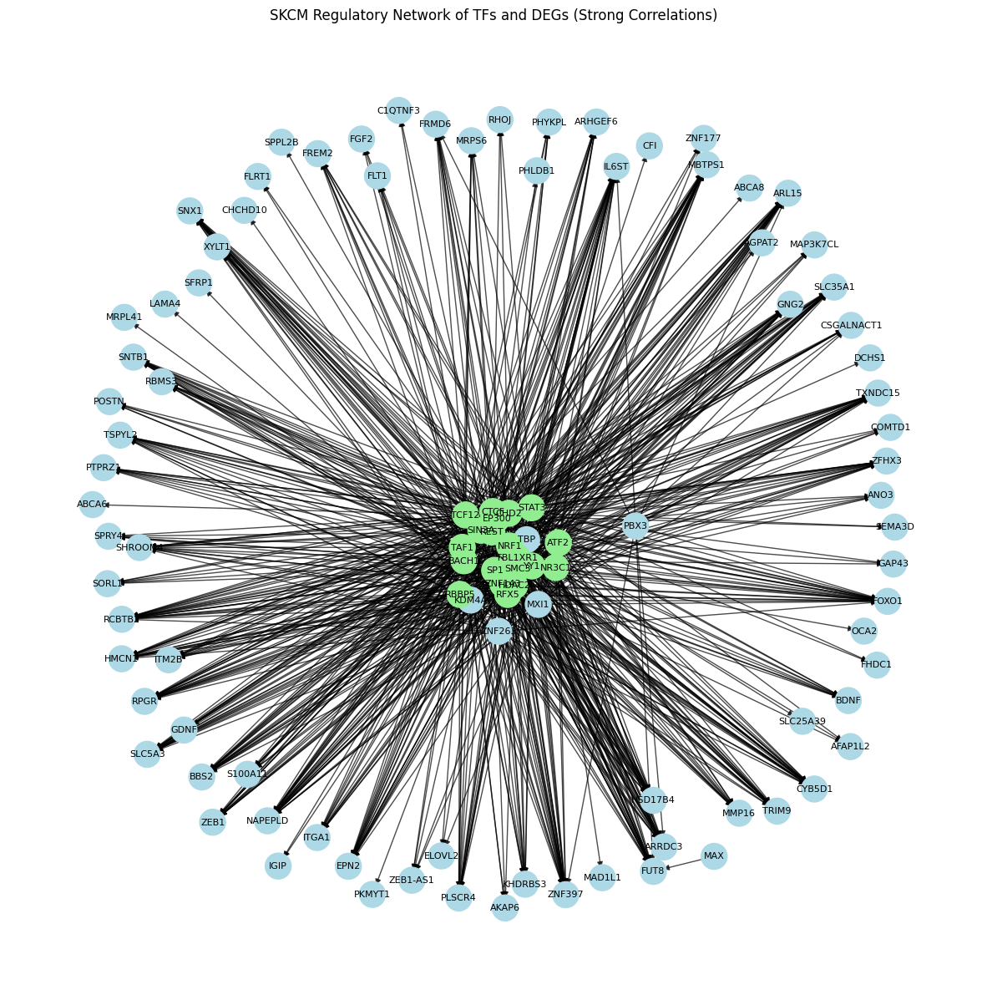

In [35]:
create_regulatory_network(SKCM_strong_corr_df, list(SKCM_significant_detfs['HGNC_symbol']), "SKCM")

## LUAD - TF integration analysis

In [36]:
LUAD_gene_expression_levels = pd.read_csv('Gene-Expression-Levels/TOIL_RSEM_TPM_LUAD.csv', low_memory=False)

In [37]:
LUAD_TF_expressions = LUAD_gene_expression_levels[LUAD_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
LUAD_TF_expressions.shape

(56, 515)

In [38]:
LUAD_high_MIR100HG_series, LUAD_low_MIR100HG_series = extract_high_low_MIR100HG(LUAD_gene_expression_levels)

In [39]:
LUAD_results_df = detf_extraction(LUAD_TF_expressions, LUAD_high_MIR100HG_series, LUAD_low_MIR100HG_series)

In [40]:
LUAD_results_df["Adjusted P-value"] = multipletests(LUAD_results_df["P-value"], method="fdr_bh")[1]

LUAD_results_df["Adjusted P-value"] = pd.to_numeric(LUAD_results_df["Adjusted P-value"], errors="coerce")

LUAD_results_df = LUAD_results_df.sort_values(by="Adjusted P-value", ascending=True)

LUAD_significant_detfs = LUAD_results_df[(LUAD_results_df["Adjusted P-value"] < 0.01)]

LUAD_significant_detfs = LUAD_significant_detfs.sort_values(by="T-statistic", ascending=False)

LUAD_significant_detfs.head(20), LUAD_significant_detfs.shape

(    Ensembl_id HGNC_symbol  T-statistic       P-value  Adjusted P-value
 18        4198       NR3C1     7.092562  4.451196e-12      2.492670e-10
 5         1309       FOSL2     5.558864  4.389709e-08      1.229119e-06
 37        9957       BACH1     4.351710  1.638225e-05      2.021447e-04
 33        7922       TCF12     3.940647  9.305182e-05      8.684837e-04
 6         1621        REST     3.731264  2.120550e-04      1.559890e-03
 40       12003        PBX3     3.669690  2.703438e-04      1.559890e-03
 31        6829     BHLHE40     3.660067  2.785518e-04      1.559890e-03
 15        3419       GATA3     3.283682  1.096214e-03      5.580726e-03
 26        5760         MAX     3.235047  1.297023e-03      6.052775e-03
 14        3311        EZH2    -3.086969  2.132264e-03      9.185135e-03
 20        4570       HDAC1    -3.681046  2.574120e-04      1.559890e-03
 11        2825         MAZ    -4.330663  1.804864e-05      2.021447e-04
 28        6146       FOXA1    -5.317518  1.577942e

In [41]:
LUAD_top_detfs = LUAD_significant_detfs[(LUAD_significant_detfs["Adjusted P-value"] < 1e-4) & (LUAD_significant_detfs["T-statistic"] > 7)].head(200)

LUAD_top_detfs = LUAD_top_detfs.sort_values(by="T-statistic", ascending=False)

LUAD_top_detfs.head(20), LUAD_top_detfs.shape

(    Ensembl_id HGNC_symbol  T-statistic       P-value  Adjusted P-value
 18        4198       NR3C1     7.092562  4.451196e-12      2.492670e-10,
 (1, 5))

In [42]:
LUAD_top_degs = read_degs("../project/dsmp-2024-groupm22/files/LUAD_results.csv")

In [43]:
LUAD_detfs_target_dict = map_defts_targets(LUAD_significant_detfs, LUAD_top_degs)
print(LUAD_detfs_target_dict)

{'PBX3': ['GLIPR1', 'POR', 'DCN', 'FAS', 'COMTD1', 'SLIT2', 'ZCCHC24', 'FBXL7', 'EBP', 'FLAD1', 'MTX1', 'GNG2', 'COX5A', 'ANTXR1', 'THBS1', 'MAGIX', 'KLHL4', 'CCDC80', 'TCEAL7', 'SLC29A2', 'TIMM17B', 'NDUFS8', 'PDZRN3', 'TGFB3', 'PDGFRA', 'FOXH1', 'MIEN1', 'ELF3', 'GSTP1', 'CALD1', 'UQCC3', 'MMP2', 'EPB41L2', 'SPARC', 'COX8A', 'BICC1', 'GAS1', 'RAB26', 'FBN1', 'SLC25A10', 'MTG2', 'ZACN', 'CNPY2', 'BNC2', 'GALE', 'POLE', 'DACT3', 'TSEN54', 'DNM3OS', 'NECAB3', 'BOLA2B', 'MAGI2-AS3', 'FAT4', 'LUM', 'HYKK', 'PSMD4', 'DUS1L', 'GFPT2', 'CDK14', 'ELK3', 'ZNF521', 'ENO3', 'ADAMTS12', 'DKK3', 'SNAI2', 'RNFT2', 'RASGRF2', 'KRTCAP2', 'SGCD', 'CCDC183', 'CNRIP1', 'LAYN', 'MRPS26', 'STARD10', 'DDR2', 'POLR2H', 'ZEB1', 'TMEM141', 'CRACR2B', 'ASPSCR1', 'THY1', 'CLIC4', 'TSACC', 'ERP29', 'TSHZ3', 'HES6', 'NDUFB11', 'BEND6', 'PRRX1', 'OMD', 'TMUB1', 'LLGL2', 'SCRIB', 'NDUFA7', 'MZT2B', 'NAP1L3', 'AIFM1', 'CLN6'], 'NR3C1': ['MRPS15', 'ARHGEF39', 'HID1', 'TMEM141', 'POR', 'CRACR2B', 'ENO3', 'COMTD1', 'EL

In [44]:
LUAD_expressions_df = LUAD_gene_expression_levels.drop(columns=["Unnamed: 0"])
LUAD_expressions_df = LUAD_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")

In [45]:
LUAD_correlation_df = get_correlation_df(LUAD_detfs_target_dict, LUAD_expressions_df)
LUAD_correlation_df

,TF,Target,Correlation
0,PBX3,GLIPR1,0.229169
1,PBX3,POR,0.065026
2,PBX3,DCN,0.226901
3,PBX3,FAS,0.304918
4,PBX3,COMTD1,-0.231136
...,...,...,...
4068,CHD2,MZT2B,-0.166625
4069,CHD2,NAP1L3,0.154600
4070,CHD2,AIFM1,0.262940
4071,CHD2,CLN6,0.245476


In [46]:
LUAD_strong_corr_df = LUAD_correlation_df[LUAD_correlation_df["Correlation"].abs() > 0.5]
LUAD_strong_corr_df

,TF,Target,Correlation
252,TCF12,PDGFRB,0.513242
253,TCF12,SLIT2,0.515247
263,TCF12,ANTXR1,0.541937
292,TCF12,CALD1,0.555129
295,TCF12,EPB41L2,0.512449
298,TCF12,FSTL1,0.530685
358,TCF12,DDR2,0.537044
363,TCF12,ZEB1,0.533727
370,TCF12,CLIC4,0.514718
535,BACH1,PLXDC2,0.518721


LUAD Network has 19 nodes and 22 edges.
Top hub TFs: [('TCF12', 0.5), ('BACH1', 0.3333333333333333), ('FOSL2', 0.05555555555555555), ('REST', 0.05555555555555555)]


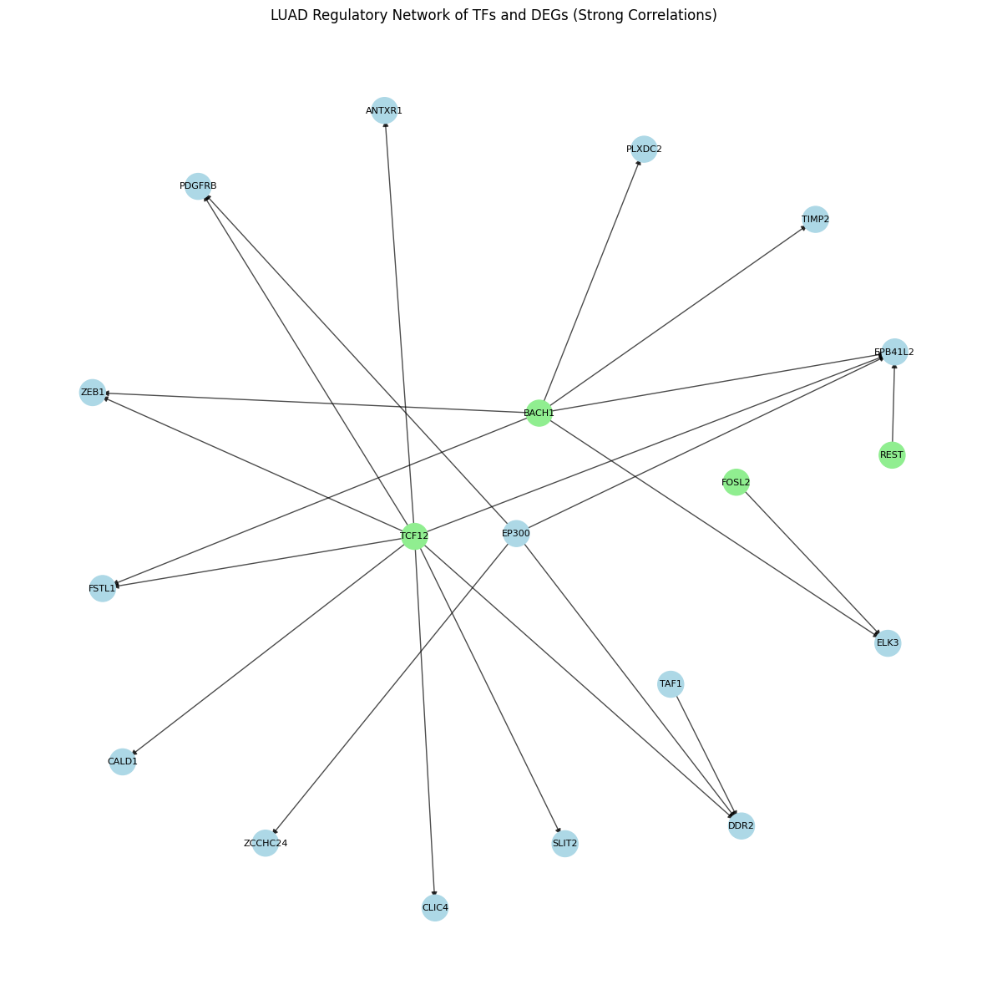

In [47]:
create_regulatory_network(LUAD_strong_corr_df, list(LUAD_significant_detfs['HGNC_symbol']), "LUAD")

## PRAD - TF integration analysis

In [48]:
PRAD_gene_expression_levels = pd.read_csv('Gene-Expression-Levels/TOIL_RSEM_TPM_PRAD.csv', low_memory=False)

In [49]:
PRAD_TF_expressions = PRAD_gene_expression_levels[PRAD_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
PRAD_TF_expressions.shape

(56, 497)

In [50]:
PRAD_high_MIR100HG_series, PRAD_low_MIR100HG_series = extract_high_low_MIR100HG(PRAD_gene_expression_levels)

In [51]:
PRAD_results_df = detf_extraction(PRAD_TF_expressions, PRAD_high_MIR100HG_series, PRAD_low_MIR100HG_series)

In [52]:
PRAD_results_df["Adjusted P-value"] = multipletests(PRAD_results_df["P-value"], method="fdr_bh")[1]

PRAD_results_df["Adjusted P-value"] = pd.to_numeric(PRAD_results_df["Adjusted P-value"], errors="coerce")

PRAD_results_df = PRAD_results_df.sort_values(by="Adjusted P-value", ascending=True)

PRAD_significant_detfs = PRAD_results_df[(PRAD_results_df["Adjusted P-value"] < 0.01)]

PRAD_significant_detfs = PRAD_significant_detfs.sort_values(by="T-statistic", ascending=False)

PRAD_significant_detfs.head(20), PRAD_significant_detfs.shape

(    Ensembl_id HGNC_symbol  T-statistic       P-value  Adjusted P-value
 27        6033       FOXP2    13.716473  3.743197e-35      2.096190e-33
 18        4198       NR3C1    11.479432  7.372280e-27      2.064238e-25
 15        3419       GATA3    10.344777  8.312059e-23      1.551584e-21
 5         1309       FOSL2    10.006739  1.515254e-21      2.121356e-20
 45       13234       CEBPB     9.947495  2.386936e-21      2.673369e-20
 22        4984        MXI1     7.345792  9.494772e-13      7.595817e-12
 26        5760         MAX     7.101578  4.702388e-12      3.291672e-11
 31        6829     BHLHE40     6.727496  5.155340e-11      3.207767e-10
 36        9124      TCF7L2     6.534298  1.664192e-10      9.319474e-10
 41       12387       STAT3     6.040691  3.094166e-09      1.575212e-08
 52       17545       TEAD4     5.938178  5.446606e-09      2.541750e-08
 43       12783         FOS     5.800711  1.204958e-08      5.190589e-08
 33        7922       TCF12     5.485465  6.640824e

In [53]:
PRAD_top_detfs = PRAD_significant_detfs[(PRAD_significant_detfs["Adjusted P-value"] < 1e-4) & (PRAD_significant_detfs["T-statistic"] > 7)].head(200)

PRAD_top_detfs = PRAD_top_detfs.sort_values(by="T-statistic", ascending=False)

PRAD_top_detfs.head(20), PRAD_top_detfs.shape

(    Ensembl_id HGNC_symbol  T-statistic       P-value  Adjusted P-value
 27        6033       FOXP2    13.716473  3.743197e-35      2.096190e-33
 18        4198       NR3C1    11.479432  7.372280e-27      2.064238e-25
 15        3419       GATA3    10.344777  8.312059e-23      1.551584e-21
 5         1309       FOSL2    10.006739  1.515254e-21      2.121356e-20
 45       13234       CEBPB     9.947495  2.386936e-21      2.673369e-20
 22        4984        MXI1     7.345792  9.494772e-13      7.595817e-12
 26        5760         MAX     7.101578  4.702388e-12      3.291672e-11,
 (7, 5))

In [54]:
PRAD_top_degs = read_degs("../project/dsmp-2024-groupm22/files/PRAD_results.csv")

In [55]:
PRAD_detfs_target_dict = map_defts_targets(PRAD_significant_detfs, PRAD_top_degs)
print(PRAD_detfs_target_dict)

{'PBX3': ['MXRA7', 'EXOSC4', 'YIF1A', 'SLC25A22', 'LMOD1', 'HGH1', 'SYNGR2', 'SYNPO2', 'MFSD3', 'ATP2B4', 'MLST8', 'DANCR', 'POLD2', 'CAV1', 'ITGB1BP2', 'MEIS1', 'MRPL12', 'PYCR1', 'SLC25A33', 'STOM', 'TCEAL7', 'CYSRT1', 'TOMM40', 'MAZ', 'ITGA7', 'PPP1R14B', 'NOC2L', 'PPP1R12B', 'CAMSAP3', 'TOR2A', 'PAM16', 'SYDE1', 'MRPS34', 'SLC25A10', 'NOP16', 'PRICKLE2', 'DACT3', 'DNM3OS', 'BOLA2B', 'PDXP', 'TRPT1', 'RAC3', 'MAGI2-AS3', 'MRC2', 'NDUFB10', 'GFPT2', 'PDCD2L', 'SRM', 'NME1', 'DNAJB5', 'HEBP2', 'FERMT2', 'SMARCA4', 'RBMS3', 'RASGRF2', 'HPN', 'NME3', 'IPO4', 'CNRIP1', 'KRT18', 'LRRC56', 'MRPS26', 'ARMC6', 'IGFBP4', 'AGPAT4', 'POLR2H', 'CHTF18', 'CACFD1', 'SLC25A39', 'PKP3', 'RPUSD1', 'CCDC78', 'PSMG3', 'SEC16A', 'TPM1', 'RPS2', 'ACTA2', 'TIMM13', 'TXN', 'PTRH2', 'PRRX1', 'SAMD10', 'SYNPO', 'ZNHIT2', 'RHPN1', 'SLC25A45', 'SYNE4', 'NDUFA7', 'GSN', 'AIFM1'], 'NR3C1': ['EXOSC4', 'MAZ', 'SPARCL1', 'PDCD2L', 'SRM', 'HGH1', 'PPP1R14B', 'NOC2L', 'MFSD3', 'JPH2', 'SLC16A4', 'CAV2', 'ATP2B4', 'NR

In [56]:
PRAD_expressions_df = PRAD_gene_expression_levels.drop(columns=["Unnamed: 0"])
PRAD_expressions_df = PRAD_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")

In [57]:
PRAD_correlation_df = get_correlation_df(PRAD_detfs_target_dict, PRAD_expressions_df)
PRAD_correlation_df

,TF,Target,Correlation
0,PBX3,MXRA7,0.272129
1,PBX3,EXOSC4,-0.351473
2,PBX3,YIF1A,-0.290305
3,PBX3,SLC25A22,0.202802
4,PBX3,LMOD1,0.144015
...,...,...,...
4213,CHD2,AXL,0.390142
4214,CHD2,GSN,-0.014441
4215,CHD2,KANK2,0.420740
4216,CHD2,AIFM1,-0.157606


In [58]:
PRAD_strong_corr_df = PRAD_correlation_df[PRAD_correlation_df["Correlation"].abs() > 0.5]
PRAD_strong_corr_df

,TF,Target,Correlation
38,PBX3,BOLA2B,-0.529262
92,NR3C1,SPARCL1,0.645731
96,NR3C1,PPP1R14B,-0.577328
100,NR3C1,SLC16A4,0.751824
101,NR3C1,CAV2,0.739443
...,...,...,...
4059,TAF1,KANK2,0.521153
4066,CHD2,YIF1A,-0.516819
4087,CHD2,MRPL12,-0.525428
4110,CHD2,MRPS34,-0.509731


PRAD Network has 94 nodes and 292 edges.
Top hub TFs: [('FOXP2', 0.4731182795698925), ('TCF12', 0.3010752688172043), ('STAT3', 0.25806451612903225), ('FOSL2', 0.23655913978494625), ('MXI1', 0.23655913978494625), ('SIN3A', 0.21505376344086025), ('MAX', 0.20430107526881722), ('SP1', 0.20430107526881722), ('NR3C1', 0.17204301075268819), ('TAF1', 0.15053763440860216)]


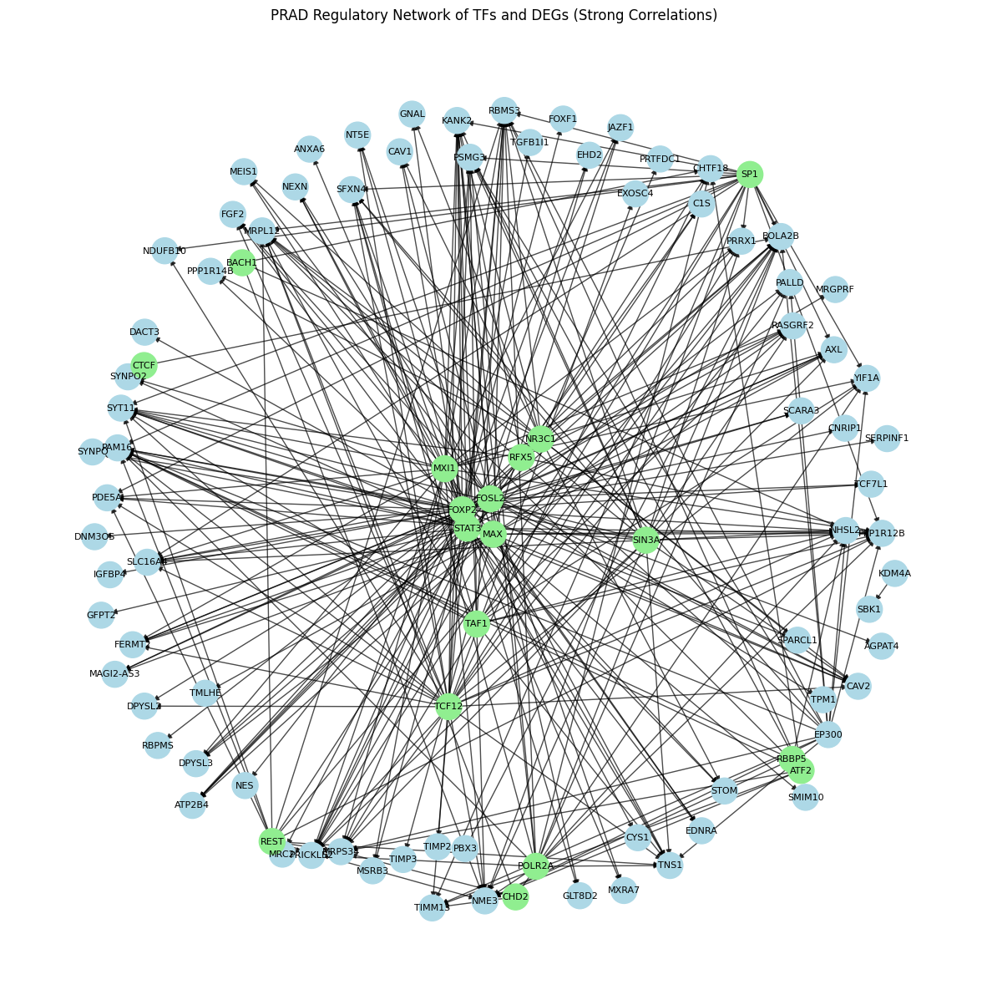

In [59]:
create_regulatory_network(PRAD_strong_corr_df, list(PRAD_significant_detfs['HGNC_symbol']), "PRAD")

## STAD - TF integration analysis

In [60]:
STAD_gene_expression_levels = pd.read_csv('Gene-Expression-Levels/TOIL_RSEM_TPM_STAD.csv', low_memory=False)

In [61]:
STAD_TF_expressions = STAD_gene_expression_levels[STAD_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
STAD_TF_expressions.shape

(56, 416)

In [62]:
STAD_high_MIR100HG_series, STAD_low_MIR100HG_series = extract_high_low_MIR100HG(STAD_gene_expression_levels)

In [63]:
STAD_results_df = detf_extraction(STAD_TF_expressions, STAD_high_MIR100HG_series, STAD_low_MIR100HG_series)

In [64]:
STAD_results_df["Adjusted P-value"] = multipletests(STAD_results_df["P-value"], method="fdr_bh")[1]

STAD_results_df["Adjusted P-value"] = pd.to_numeric(STAD_results_df["Adjusted P-value"], errors="coerce")

STAD_results_df = STAD_results_df.sort_values(by="Adjusted P-value", ascending=True)

STAD_significant_detfs = STAD_results_df[(STAD_results_df["Adjusted P-value"] < 0.01)]

STAD_significant_detfs = STAD_significant_detfs.sort_values(by="T-statistic", ascending=False)

STAD_significant_detfs.head(20), STAD_significant_detfs.shape

(    Ensembl_id HGNC_symbol  T-statistic       P-value  Adjusted P-value
 27        6033       FOXP2    17.077913  1.067089e-49      5.975698e-48
 40       12003        PBX3    12.504272  1.765019e-30      4.942054e-29
 18        4198       NR3C1    11.065101  5.771674e-25      1.077379e-23
 15        3419       GATA3     7.737397  8.145607e-14      1.140385e-12
 22        4984        MXI1     6.574577  1.511089e-10      1.410350e-09
 48       14648       GATA2     5.903554  7.567933e-09      6.054347e-08
 41       12387       STAT3     5.147589  4.157424e-07      2.586841e-06
 12        3171        USF2     3.508043  5.018878e-04      1.479248e-03
 37        9957       BACH1     3.344625  9.002003e-04      2.291419e-03
 19        4507        ATF2     3.119809  1.938380e-03      4.719534e-03
 46       13526        CHD2     2.979722  3.056298e-03      7.131363e-03
 33        7922       TCF12     2.964888  3.211701e-03      7.194210e-03
 9         2386         YY1    -3.389954  7.670585e

In [65]:
STAD_top_detfs = STAD_significant_detfs[(STAD_significant_detfs["Adjusted P-value"] < 1e-4) & (STAD_significant_detfs["T-statistic"] > 7)].head(200)

STAD_top_detfs = STAD_top_detfs.sort_values(by="T-statistic", ascending=False)

STAD_top_detfs.head(20), STAD_top_detfs.shape

(    Ensembl_id HGNC_symbol  T-statistic       P-value  Adjusted P-value
 27        6033       FOXP2    17.077913  1.067089e-49      5.975698e-48
 40       12003        PBX3    12.504272  1.765019e-30      4.942054e-29
 18        4198       NR3C1    11.065101  5.771674e-25      1.077379e-23
 15        3419       GATA3     7.737397  8.145607e-14      1.140385e-12,
 (4, 5))

In [66]:
STAD_top_degs = read_degs("../project/dsmp-2024-groupm22/files/STAD_results.csv")

In [67]:
STAD_detfs_target_dict = map_defts_targets(STAD_significant_detfs, STAD_top_degs)
print(STAD_detfs_target_dict)

{'PBX3': ['CKS2', 'DCN', 'FANCD2', 'LMOD1', 'DCXR', 'CDCA8', 'AURKA', 'SYNPO2', 'SLIT2', 'ZCCHC24', 'MIS18A', 'KPNA2', 'FBLN5', 'EBP', 'CDC25A', 'BZW2', 'UQCRH', 'CYC1', 'KIF15', 'POLD2', 'AURKB', 'COX5A', 'MRPL12', 'TK1', 'NCAPG', 'PLK1', 'CCDC80', 'PYCR1', 'TCEAL7', 'SFRP1', 'ORC1', 'VSTM4', 'MTFP1', 'HSPD1', 'RECQL4', 'CDC20', 'SYNC', 'MGP', 'CALD1', 'CDCA3', 'MARS2', 'CENPV', 'SLC25A10', 'ZACN', 'NCAPH', 'BNC2', 'TPRN', 'STON1', 'DACT3', 'TSEN54', 'CDC45', 'HSPE1', 'TUBB4B', 'MAGI2-AS3', 'GINS2', 'TUFM', 'DUS1L', 'ZC3H12A', 'RUNX1T1', 'SSC5D', 'NME1', 'HSPB6', 'BIRC5', 'ESPL1', 'SPAG5', 'DDX39A', 'CYCS', 'FERMT2', 'RBMS3', 'LAYN', 'SNRPD1', 'PKMYT1', 'DDR2', 'ASF1B', 'MELK', 'LTBP1', 'CHTF18', 'LRPPRC', 'MFAP4', 'SLC25A39', 'ZEB1', 'ZWINT', 'BRI3BP', 'FASN', 'CCNA2', 'TONSL', 'ACTA2', 'TIMM13', 'CENPM', 'ESRP2', 'PABPC5', 'OMD', 'DTYMK', 'RAD54L', 'PPIF', 'NAP1L3', 'AIFM1', 'PLK4', 'AP1G2'], 'NR3C1': ['SPARCL1', 'ARHGEF39', 'CKS2', 'MTFP1', 'FANCD2', 'HSPA9', 'HSPD1', 'AURKA', 'COL

In [68]:
STAD_expressions_df = STAD_gene_expression_levels.drop(columns=["Unnamed: 0"])
STAD_expressions_df = STAD_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")

In [69]:
STAD_correlation_df = get_correlation_df(STAD_detfs_target_dict, STAD_expressions_df)
STAD_correlation_df

,TF,Target,Correlation
0,PBX3,CKS2,-0.355633
1,PBX3,DCN,0.623605
2,PBX3,FANCD2,-0.214986
3,PBX3,LMOD1,0.663437
4,PBX3,DCXR,-0.339763
...,...,...,...
4213,CHD2,PPIF,-0.253359
4214,CHD2,NAP1L3,0.182021
4215,CHD2,AIFM1,-0.077192
4216,CHD2,PLK4,0.115948


In [70]:
STAD_strong_corr_df = STAD_correlation_df[STAD_correlation_df["Correlation"].abs() > 0.5]
STAD_strong_corr_df

,TF,Target,Correlation
1,PBX3,DCN,0.623605
3,PBX3,LMOD1,0.663437
7,PBX3,SYNPO2,0.674110
8,PBX3,SLIT2,0.694677
9,PBX3,ZCCHC24,0.728836
...,...,...,...
3877,YY1,ZWINT,0.508951
3881,YY1,FASN,0.516096
3882,YY1,CCNA2,0.558746
3899,YY1,RAD54L,0.580249


STAD Network has 98 nodes and 171 edges.
Top hub TFs: [('HDAC2', 0.41237113402061853), ('PBX3', 0.31958762886597936), ('YY1', 0.29896907216494845), ('FOXP2', 0.27835051546391754), ('NR3C1', 0.10309278350515463), ('STAT3', 0.010309278350515464)]


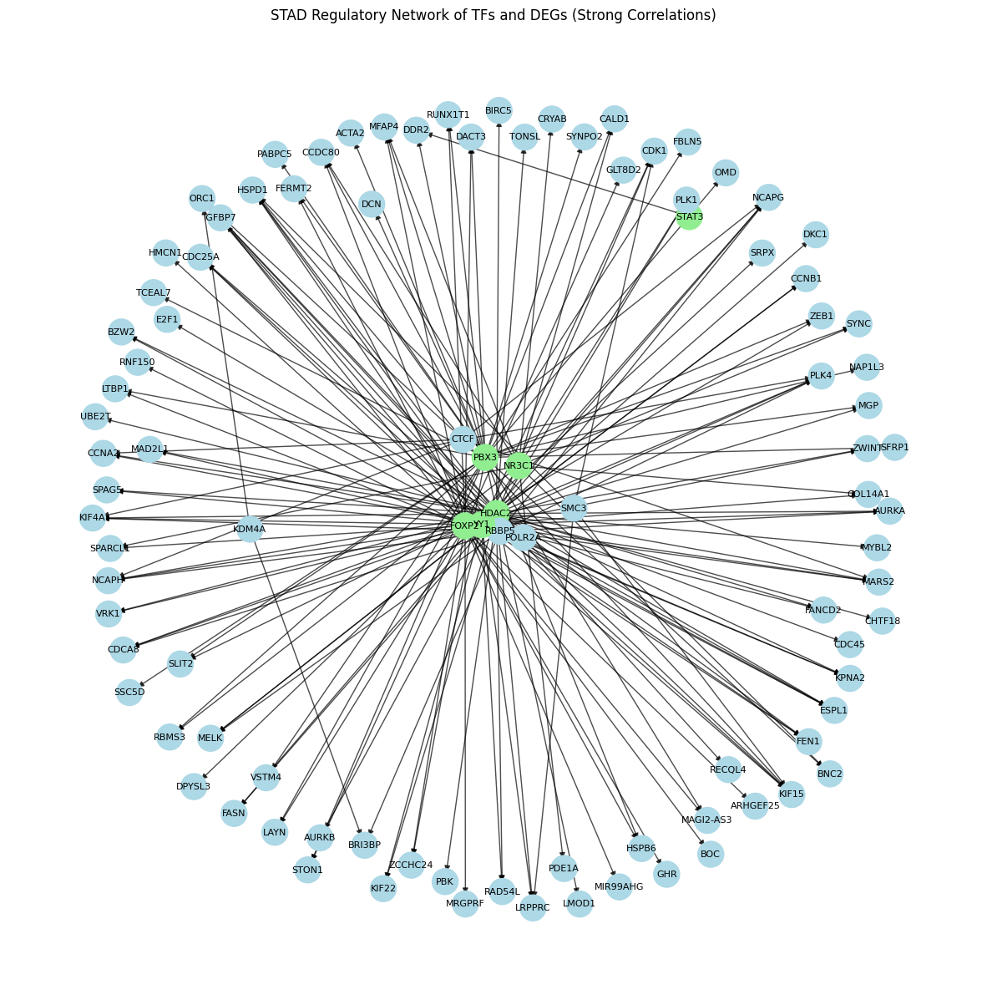

In [71]:
create_regulatory_network(STAD_strong_corr_df, list(STAD_significant_detfs['HGNC_symbol']), "STAD")

## Normal - TF integration analysis

In [72]:
GTEX_rsem = pd.read_csv('TOIL_GTEX_RSEM_TPM_5_CANCERS.csv', low_memory=False)
GTEX_rsem[GTEX_rsem["HGNC_symbol"] == "MIR100HG"]

,Unnamed: 0,HGNC_symbol,GTEX_111CU_0326_SM_5GZXO,GTEX_111CU_0526_SM_5EGHK,GTEX_111CU_0926_SM_5EGIK,GTEX_111CU_1126_SM_5EGIM,GTEX_111CU_1526_SM_5N9FS,GTEX_111CU_1926_SM_5GZYZ,GTEX_111FC_0126_SM_5N9DL,GTEX_111FC_1126_SM_5GZWU,...,GTEX_ZYY3_1726_SM_5EGH3,GTEX_ZYY3_2926_SM_5GIEB,GTEX_ZZ64_0426_SM_5E43F,GTEX_ZZ64_1026_SM_5GZXG,GTEX_ZZ64_1726_SM_5GZYB,GTEX_ZZPT_0226_SM_5E43X,GTEX_ZZPT_1326_SM_5E43H,GTEX_ZZPU_0526_SM_5E44U,GTEX_ZZPU_0726_SM_5N9C8,GTEX_ZZPU_1426_SM_5GZZ6
42580,ENSG00000255248,MIR100HG,4.8182,0.9789,-0.0725,2.3649,5.1457,3.9847,2.4117,3.3759,...,-0.2498,0.9935,0.24,3.3787,3.136,4.0558,3.0706,3.9166,2.5263,3.616


In [73]:
GTEX_phenotype = pd.read_csv('TOIL_GTEX_PHENOTYPE_5_CANCERS.csv', low_memory=False)

In [74]:
available_normal_samples = set(GTEX_rsem.columns)
len(available_normal_samples), available_normal_samples

(1543,
 {'GTEX_WFON_2126_SM_3LK7O',
  'GTEX_11DXZ_1826_SM_5H12Y',
  'GTEX_OOBK_2025_SM_3LK5S',
  'GTEX_S4Q7_0008_SM_3NM8A',
  'GTEX_WXYG_0008_SM_4ONDU',
  'GTEX_WFG7_1826_SM_3GIL1',
  'GTEX_111YS_1526_SM_5GZYW',
  'GTEX_14AS3_1526_SM_5Q5ED',
  'GTEX_S95S_0008_SM_4AT5M',
  'GTEX_13OW8_1726_SM_5L3GO',
  'GTEX_PW2O_0008_SM_48TEB',
  'GTEX_13PVQ_0926_SM_5IJFD',
  'GTEX_13VXU_0126_SM_5SI9F',
  'GTEX_ZLV1_0826_SM_4WWEQ',
  'GTEX_11ZTT_2126_SM_5CVLO',
  'GTEX_13N11_2326_SM_5IJBF',
  'GTEX_132NY_2826_SM_5P9G2',
  'GTEX_U8XE_0226_SM_4E3J3',
  'GTEX_132NY_0326_SM_5IJBL',
  'GTEX_13CF3_2426_SM_5IFGX',
  'GTEX_11WQK_0008_SM_5SI6T',
  'GTEX_11OF3_2626_SM_5GU7F',
  'GTEX_R55E_0126_SM_2TC5Y',
  'GTEX_SIU8_0126_SM_2XCDT',
  'GTEX_WY7C_2026_SM_4ONCM',
  'GTEX_VUSG_2526_SM_4KL1V',
  'GTEX_OXRL_0008_SM_3NB29',
  'GTEX_RUSQ_1526_SM_2TF62',
  'GTEX_12ZZX_0126_SM_5EGK9',
  'GTEX_O5YW_0126_SM_3LK6D',
  'GTEX_111YS_0626_SM_5GZXV',
  'GTEX_QCQG_0008_SM_48U2G',
  'GTEX_13OW6_0826_SM_5L3GA',
  'GTEX_S4UY_0008_SM

## Pancreas

In [75]:
PAAD_normal_samples = GTEX_phenotype[GTEX_phenotype["Primary_site"] == "Pancreas"]
PAAD_normal_samples.head(3)

,Unnamed: 0,Sample,Site_details,Primary_site,Gender,Patient,Cohort
2,18,GTEX_111CU_0526_SM_5EGHK,Pancreas,Pancreas,male,GTEX_111CU,GTEX
18,75,GTEX_111YS_1226_SM_5EGGJ,Pancreas,Pancreas,male,GTEX_111YS,GTEX
23,97,GTEX_1122O_0726_SM_5GIEV,Pancreas,Pancreas,female,GTEX_1122O,GTEX


In [76]:
PAAD_normal_samples_list = set(PAAD_normal_samples["Sample"].tolist())
PAAD_normal_samples_list = PAAD_normal_samples_list.intersection(available_normal_samples)
PAAD_normal_samples_list = list(PAAD_normal_samples_list)
len(PAAD_normal_samples_list), PAAD_normal_samples_list

(167,
 ['GTEX_WFJO_0626_SM_4LVMC',
  'GTEX_ZTPG_1026_SM_5DUWP',
  'GTEX_ZYW4_2126_SM_59HJ9',
  'GTEX_11I78_0626_SM_5A5LZ',
  'GTEX_QCQG_0426_SM_48U29',
  'GTEX_13FTW_0526_SM_5IFIP',
  'GTEX_ZEX8_1026_SM_4WKHE',
  'GTEX_11VI4_0426_SM_5EGHZ',
  'GTEX_XPVG_0326_SM_4B653',
  'GTEX_117YX_0226_SM_5EGH6',
  'GTEX_12WSG_1026_SM_5EGII',
  'GTEX_S4P3_0626_SM_4AD59',
  'GTEX_W5X1_0226_SM_5CHTO',
  'GTEX_ZF2S_0426_SM_4WKGP',
  'GTEX_ZYWO_1326_SM_5SI8X',
  'GTEX_VUSG_0326_SM_3GIJ7',
  'GTEX_YEC3_0626_SM_5IFHZ',
  'GTEX_ZYY3_0826_SM_5E44R',
  'GTEX_145ME_0326_SM_5S2QO',
  'GTEX_139YR_1526_SM_5IFJ1',
  'GTEX_Q2AH_0926_SM_48TZK',
  'GTEX_X3Y1_0726_SM_3P5YU',
  'GTEX_PW2O_0826_SM_48TC5',
  'GTEX_WH7G_0826_SM_4LVMR',
  'GTEX_RWS6_1126_SM_47JXC',
  'GTEX_R53T_0426_SM_48FEM',
  'GTEX_ZP4G_0426_SM_4YCER',
  'GTEX_WI4N_1826_SM_4OOSF',
  'GTEX_ZV7C_0726_SM_59HKH',
  'GTEX_PX3G_1026_SM_48TZW',
  'GTEX_ZC5H_0826_SM_5N9FH',
  'GTEX_ZVZP_0626_SM_59HL5',
  'GTEX_OOBJ_1026_SM_3NB2L',
  'GTEX_R55G_0326_SM_48FDM',
 

In [77]:
PAAD_normal_gene_expression_levels = ["Unnamed: 0", "HGNC_symbol"] + PAAD_normal_samples_list
PAAD_normal_gene_expression_levels = GTEX_rsem[PAAD_normal_gene_expression_levels]
PAAD_normal_gene_expression_levels = PAAD_normal_gene_expression_levels.set_index("Unnamed: 0")
PAAD_normal_gene_expression_levels.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,TSPAN6,2.8301,2.8522,3.0842,2.5561,3.4398,2.4675,2.5634,2.9655,2.8602,...,3.1028,3.5982,2.6255,2.3816,2.7636,3.1765,2.6232,2.9338,2.8321,2.9488
ENSG00000000005,TNMD,-9.9658,-9.9658,-5.0116,-5.0116,-1.7322,-9.9658,-5.5735,-2.2447,-9.9658,...,-1.9942,-9.9658,-9.9658,-4.6082,-9.9658,-4.2934,-5.0116,-9.9658,-6.5064,-2.4659
ENSG00000000419,DPM1,4.1294,4.3972,4.1228,3.4920,4.6089,3.8289,3.3017,3.8896,4.3060,...,4.4945,4.3321,4.2227,3.8837,4.4549,4.3256,4.2457,3.5312,4.1579,4.2510
ENSG00000000457,SCYL3,1.7575,1.5806,1.3623,0.9862,1.7532,1.0151,0.6050,1.0983,1.5563,...,1.6558,2.3816,1.3511,1.0711,1.5709,1.2815,1.4441,0.7579,0.5170,1.8036
ENSG00000000460,FIRRM,0.0580,-0.0725,-0.3383,-0.2845,-0.2671,-1.0262,-0.6416,-1.3183,-0.2328,...,-0.7834,1.0711,-0.3940,-0.8084,-0.1187,-0.2845,-0.1828,-0.8084,-1.1488,-0.2328


In [78]:
PAAD_normal_TF_expressions = PAAD_normal_gene_expression_levels[PAAD_normal_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
PAAD_normal_TF_expressions.shape
PAAD_normal_TF_expressions.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000006194,ZNF263,3.0825,3.1360,3.1045,2.5061,3.0481,2.6114,2.2813,2.5707,3.0859,...,2.9984,3.1844,2.6873,2.9205,2.7889,2.7615,2.8622,2.0254,2.2452,3.2870
ENSG00000012048,BRCA1,-0.5332,-0.5543,-0.7834,-0.6193,0.5170,-1.2142,-0.8084,-0.4131,-0.2671,...,-0.3940,1.0151,-0.4921,-1.1488,0.2029,-0.1993,0.1776,-1.1811,-0.8863,-0.2845
ENSG00000066135,KDM4A,2.1476,2.0844,1.0573,1.8524,2.2513,1.7532,1.7575,2.0111,2.2603,...,2.1766,2.8321,2.1766,1.6045,1.8036,2.2931,2.0004,1.5902,1.3735,2.1541
ENSG00000071564,TCF3,3.8857,4.3133,3.7539,3.2251,3.7794,3.2722,2.6510,3.6312,3.6113,...,3.4958,4.2056,3.3047,3.4596,3.7898,3.0791,3.5547,3.2389,2.9544,3.8591
ENSG00000073614,KDM5A,2.0535,1.8564,2.0325,1.4808,2.3280,1.3454,0.6332,1.3051,1.8564,...,2.1345,1.9034,1.9895,1.4011,1.5366,1.4494,1.7617,1.1641,1.0363,1.6045


In [79]:
PAAD_normal_high_MIR100HG_series, PAAD_normal_low_MIR100HG_series = extract_high_low_MIR100HG(PAAD_normal_gene_expression_levels)

In [80]:
PAAD_normal_results_df = detf_extraction(PAAD_normal_TF_expressions, PAAD_normal_high_MIR100HG_series, PAAD_normal_low_MIR100HG_series)

In [81]:
PAAD_normal_results_df["Adjusted P-value"] = multipletests(PAAD_normal_results_df["P-value"], method="fdr_bh")[1]

PAAD_normal_results_df["Adjusted P-value"] = pd.to_numeric(PAAD_normal_results_df["Adjusted P-value"], errors="coerce")

PAAD_normal_results_df = PAAD_normal_results_df.sort_values(by="Adjusted P-value", ascending=True)

PAAD_normal_significant_detfs = PAAD_normal_results_df[(PAAD_normal_results_df["Adjusted P-value"] < 0.01)]

PAAD_normal_significant_detfs = PAAD_normal_significant_detfs.sort_values(by="T-statistic", ascending=False)

PAAD_normal_significant_detfs.head(20), PAAD_normal_significant_detfs.shape

(         Ensembl_id HGNC_symbol  T-statistic   P-value  Adjusted P-value
 5   ENSG00000075426       FOSL2     4.775996  0.000005          0.000295
 31  ENSG00000134107     BHLHE40     4.228185  0.000047          0.001180
 32  ENSG00000136997         MYC     4.102805  0.000081          0.001180
 33  ENSG00000140262       TCF12     4.079728  0.000095          0.001180
 7   ENSG00000089902       RCOR1     4.000738  0.000126          0.001180
 45  ENSG00000172216       CEBPB     3.997500  0.000120          0.001180
 13  ENSG00000106459        NRF1     3.896001  0.000184          0.001305
 41  ENSG00000168610       STAT3     3.881812  0.000186          0.001305
 6   ENSG00000084093        REST     3.756670  0.000300          0.001613
 40  ENSG00000167081        PBX3     3.750395  0.000301          0.001613
 43  ENSG00000170345         FOS     3.697315  0.000317          0.001613
 18  ENSG00000113580       NR3C1     3.623766  0.000469          0.002190
 36  ENSG00000148737      TCF7L2     3

In [82]:
PAAD_normal_significant_detfs = PAAD_normal_significant_detfs.head(10)

In [83]:
PAAD_normal_top_degs = read_degs("../project/dsmp-2024-groupm22/files/PAAD_normal_results.csv")

In [84]:
PAAD_normal_detfs_target_dict = map_defts_targets(PAAD_normal_significant_detfs, PAAD_normal_top_degs)
print(PAAD_normal_detfs_target_dict)

{'PBX3': ['BASP1', 'MEX3B', 'SPTY2D1', 'ONECUT2', 'CYP1B1', 'FOXD2', 'HPCAL4', 'ZNF625', 'GRAP', 'AGO1', 'ZNF138', 'SLC20A1', 'HIC1', 'CPZ', 'SCG2', 'BCL6B', 'CAP1', 'GLCE', 'SLC9A7', 'CNR1', 'BATF3', 'LAMC1', 'TTLL3', 'NOXA1', 'WASF3', 'RAI1', 'AP5Z1', 'RRN3P2', 'FAM43A', 'ARHGEF35', 'ARPP19', 'LRRC40', 'TSHZ2', 'RGS1', 'STON1-GTF2A1L', 'GJA1', 'ADAMTS14', 'PRRX1', 'SAMD11', 'CTTN', 'LINC00313', 'ZNF90', 'HAPLN3', 'KLHL26', 'DACT1', 'RGS4', 'DGKH', 'CIRBP-AS1', 'JAK3', 'SMAD9', 'HOXD8', 'SALL1', 'ST8SIA4', 'IER5L', 'CIITA', 'DLL4', 'INHBA', 'FGF11', 'HSF2', 'FAM138B', 'COL11A1', 'KLHL11', 'KIF24', 'MAP2K3', 'COL9A3', 'GPR153', 'RUNX1', 'ADAM19'], 'NR3C1': ['BASP1', 'MEX3B', 'ONECUT2', 'CYP1B1', 'PEBP4', 'SCGB2A1', 'SLC20A1', 'DISC1', 'NOXA1', 'HOXB4', 'RAI1', 'LRRC40', 'SAMD11', 'LINC00313', 'PRDM1', 'DGKH', 'GLA', 'SFRP4', 'MFGE8', 'ASS1', 'GPR153', 'LINC00479'], 'STAT3': ['SPTY2D1', 'ZNF625', 'HIC1', 'OSM', 'SRPX', 'LIN7A', 'GLCE', 'BATF3', 'WASF3', 'LRCH2', 'MMP11', 'PROB1', 'SLC19

In [85]:
PAAD_normal_gene_expression_levels = PAAD_normal_gene_expression_levels.reset_index()

In [86]:
PAAD_normal_expressions_df = PAAD_normal_gene_expression_levels.drop(columns=["Unnamed: 0"])
PAAD_normal_expressions_df = PAAD_normal_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")

In [87]:
PAAD_normal_correlation_df = get_correlation_df(PAAD_normal_detfs_target_dict, PAAD_normal_expressions_df)
PAAD_normal_strong_corr_df = PAAD_normal_correlation_df[PAAD_normal_correlation_df["Correlation"].abs() > 0.5]
PAAD_normal_strong_corr_df

,TF,Target,Correlation
0,PBX3,BASP1,0.783900
1,PBX3,MEX3B,0.786323
2,PBX3,SPTY2D1,0.934467
3,PBX3,ONECUT2,0.772110
4,PBX3,CYP1B1,0.705909
...,...,...,...
3324,CHD2,SGIP1,0.744507
3325,CHD2,DLL4,0.793556
3326,CHD2,CIITA,0.804914
3328,CHD2,ZBTB7C,0.678911


PAAD_normal Network has 170 nodes and 2799 edges.
Top hub TFs: [('REST', 0.5857988165680473), ('TCF12', 0.5680473372781065), ('STAT3', 0.5029585798816568), ('NRF1', 0.3846153846153846), ('PBX3', 0.35502958579881655), ('FOSL2', 0.2781065088757396)]


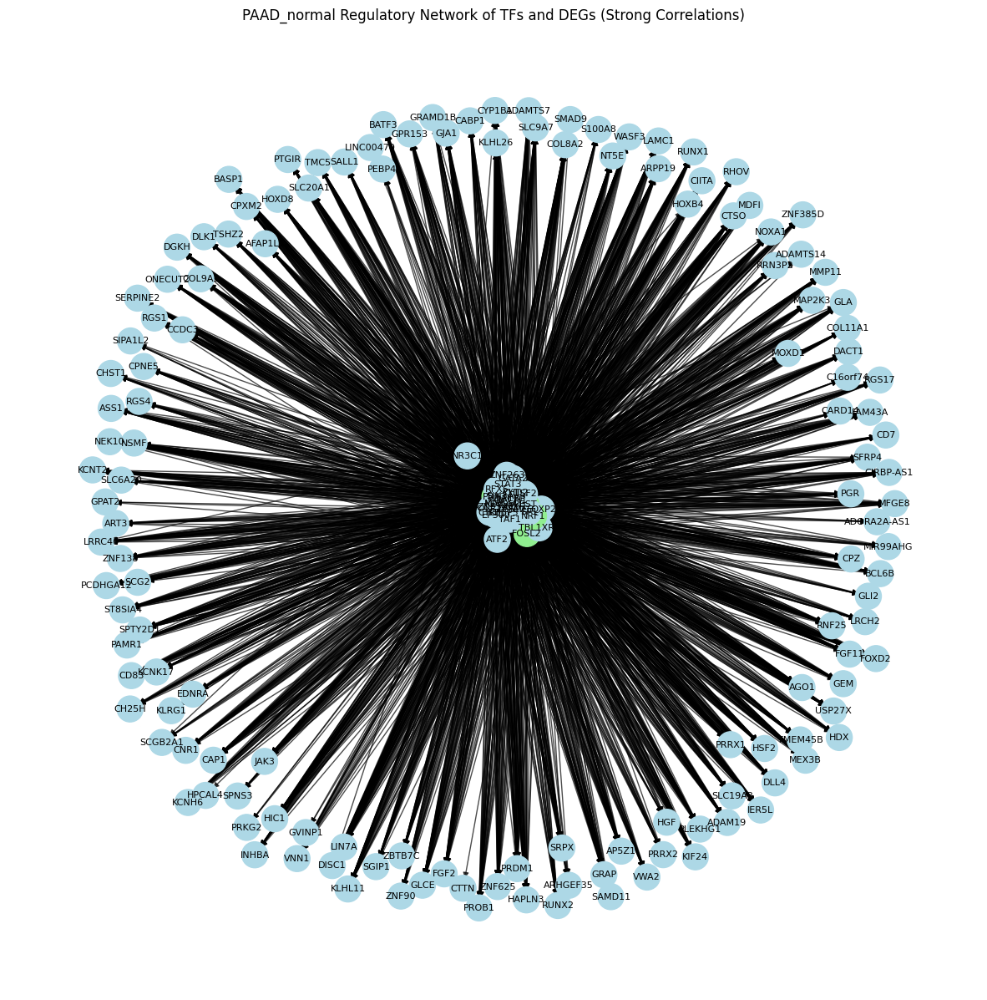

In [88]:
create_regulatory_network(PAAD_normal_strong_corr_df, list(PAAD_normal_significant_detfs['HGNC_symbol']), "PAAD_normal")

## Skin

In [89]:
SKCM_normal_samples = GTEX_phenotype[GTEX_phenotype["Primary_site"] == "Pancreas"]
SKCM_normal_samples.head(3)

,Unnamed: 0,Sample,Site_details,Primary_site,Gender,Patient,Cohort
2,18,GTEX_111CU_0526_SM_5EGHK,Pancreas,Pancreas,male,GTEX_111CU,GTEX
18,75,GTEX_111YS_1226_SM_5EGGJ,Pancreas,Pancreas,male,GTEX_111YS,GTEX
23,97,GTEX_1122O_0726_SM_5GIEV,Pancreas,Pancreas,female,GTEX_1122O,GTEX


In [90]:
SKCM_normal_samples_list = set(SKCM_normal_samples["Sample"].tolist())
SKCM_normal_samples_list = SKCM_normal_samples_list.intersection(available_normal_samples)
SKCM_normal_samples_list = list(SKCM_normal_samples_list)
len(SKCM_normal_samples_list), SKCM_normal_samples_list

(167,
 ['GTEX_WFJO_0626_SM_4LVMC',
  'GTEX_ZTPG_1026_SM_5DUWP',
  'GTEX_ZYW4_2126_SM_59HJ9',
  'GTEX_11I78_0626_SM_5A5LZ',
  'GTEX_QCQG_0426_SM_48U29',
  'GTEX_13FTW_0526_SM_5IFIP',
  'GTEX_ZEX8_1026_SM_4WKHE',
  'GTEX_11VI4_0426_SM_5EGHZ',
  'GTEX_XPVG_0326_SM_4B653',
  'GTEX_117YX_0226_SM_5EGH6',
  'GTEX_12WSG_1026_SM_5EGII',
  'GTEX_S4P3_0626_SM_4AD59',
  'GTEX_W5X1_0226_SM_5CHTO',
  'GTEX_ZF2S_0426_SM_4WKGP',
  'GTEX_ZYWO_1326_SM_5SI8X',
  'GTEX_VUSG_0326_SM_3GIJ7',
  'GTEX_YEC3_0626_SM_5IFHZ',
  'GTEX_ZYY3_0826_SM_5E44R',
  'GTEX_145ME_0326_SM_5S2QO',
  'GTEX_139YR_1526_SM_5IFJ1',
  'GTEX_Q2AH_0926_SM_48TZK',
  'GTEX_X3Y1_0726_SM_3P5YU',
  'GTEX_PW2O_0826_SM_48TC5',
  'GTEX_WH7G_0826_SM_4LVMR',
  'GTEX_RWS6_1126_SM_47JXC',
  'GTEX_R53T_0426_SM_48FEM',
  'GTEX_ZP4G_0426_SM_4YCER',
  'GTEX_WI4N_1826_SM_4OOSF',
  'GTEX_ZV7C_0726_SM_59HKH',
  'GTEX_PX3G_1026_SM_48TZW',
  'GTEX_ZC5H_0826_SM_5N9FH',
  'GTEX_ZVZP_0626_SM_59HL5',
  'GTEX_OOBJ_1026_SM_3NB2L',
  'GTEX_R55G_0326_SM_48FDM',
 

In [91]:
SKCM_normal_gene_expression_levels = ["Unnamed: 0", "HGNC_symbol"] + SKCM_normal_samples_list
SKCM_normal_gene_expression_levels = GTEX_rsem[SKCM_normal_gene_expression_levels]
SKCM_normal_gene_expression_levels = SKCM_normal_gene_expression_levels.set_index("Unnamed: 0")
SKCM_normal_gene_expression_levels.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,TSPAN6,2.8301,2.8522,3.0842,2.5561,3.4398,2.4675,2.5634,2.9655,2.8602,...,3.1028,3.5982,2.6255,2.3816,2.7636,3.1765,2.6232,2.9338,2.8321,2.9488
ENSG00000000005,TNMD,-9.9658,-9.9658,-5.0116,-5.0116,-1.7322,-9.9658,-5.5735,-2.2447,-9.9658,...,-1.9942,-9.9658,-9.9658,-4.6082,-9.9658,-4.2934,-5.0116,-9.9658,-6.5064,-2.4659
ENSG00000000419,DPM1,4.1294,4.3972,4.1228,3.4920,4.6089,3.8289,3.3017,3.8896,4.3060,...,4.4945,4.3321,4.2227,3.8837,4.4549,4.3256,4.2457,3.5312,4.1579,4.2510
ENSG00000000457,SCYL3,1.7575,1.5806,1.3623,0.9862,1.7532,1.0151,0.6050,1.0983,1.5563,...,1.6558,2.3816,1.3511,1.0711,1.5709,1.2815,1.4441,0.7579,0.5170,1.8036
ENSG00000000460,FIRRM,0.0580,-0.0725,-0.3383,-0.2845,-0.2671,-1.0262,-0.6416,-1.3183,-0.2328,...,-0.7834,1.0711,-0.3940,-0.8084,-0.1187,-0.2845,-0.1828,-0.8084,-1.1488,-0.2328


In [92]:
SKCM_normal_TF_expressions = SKCM_normal_gene_expression_levels[SKCM_normal_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
SKCM_normal_TF_expressions.shape
SKCM_normal_TF_expressions.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000006194,ZNF263,3.0825,3.1360,3.1045,2.5061,3.0481,2.6114,2.2813,2.5707,3.0859,...,2.9984,3.1844,2.6873,2.9205,2.7889,2.7615,2.8622,2.0254,2.2452,3.2870
ENSG00000012048,BRCA1,-0.5332,-0.5543,-0.7834,-0.6193,0.5170,-1.2142,-0.8084,-0.4131,-0.2671,...,-0.3940,1.0151,-0.4921,-1.1488,0.2029,-0.1993,0.1776,-1.1811,-0.8863,-0.2845
ENSG00000066135,KDM4A,2.1476,2.0844,1.0573,1.8524,2.2513,1.7532,1.7575,2.0111,2.2603,...,2.1766,2.8321,2.1766,1.6045,1.8036,2.2931,2.0004,1.5902,1.3735,2.1541
ENSG00000071564,TCF3,3.8857,4.3133,3.7539,3.2251,3.7794,3.2722,2.6510,3.6312,3.6113,...,3.4958,4.2056,3.3047,3.4596,3.7898,3.0791,3.5547,3.2389,2.9544,3.8591
ENSG00000073614,KDM5A,2.0535,1.8564,2.0325,1.4808,2.3280,1.3454,0.6332,1.3051,1.8564,...,2.1345,1.9034,1.9895,1.4011,1.5366,1.4494,1.7617,1.1641,1.0363,1.6045


In [93]:
SKCM_normal_high_MIR100HG_series, SKCM_normal_low_MIR100HG_series = extract_high_low_MIR100HG(SKCM_normal_gene_expression_levels)


In [94]:
SKCM_normal_results_df = detf_extraction(SKCM_normal_TF_expressions, SKCM_normal_high_MIR100HG_series, SKCM_normal_low_MIR100HG_series)


In [95]:
SKCM_normal_results_df["Adjusted P-value"] = multipletests(SKCM_normal_results_df["P-value"], method="fdr_bh")[1]

SKCM_normal_results_df["Adjusted P-value"] = pd.to_numeric(SKCM_normal_results_df["Adjusted P-value"], errors="coerce")

SKCM_normal_results_df = SKCM_normal_results_df.sort_values(by="Adjusted P-value", ascending=True)

SKCM_normal_significant_detfs = SKCM_normal_results_df[(SKCM_normal_results_df["Adjusted P-value"] < 0.01)]

SKCM_normal_significant_detfs = SKCM_normal_significant_detfs.sort_values(by="T-statistic", ascending=False)

SKCM_normal_significant_detfs.head(20), SKCM_normal_significant_detfs.shape

(         Ensembl_id HGNC_symbol  T-statistic   P-value  Adjusted P-value
 5   ENSG00000075426       FOSL2     4.775996  0.000005          0.000295
 31  ENSG00000134107     BHLHE40     4.228185  0.000047          0.001180
 32  ENSG00000136997         MYC     4.102805  0.000081          0.001180
 33  ENSG00000140262       TCF12     4.079728  0.000095          0.001180
 7   ENSG00000089902       RCOR1     4.000738  0.000126          0.001180
 45  ENSG00000172216       CEBPB     3.997500  0.000120          0.001180
 13  ENSG00000106459        NRF1     3.896001  0.000184          0.001305
 41  ENSG00000168610       STAT3     3.881812  0.000186          0.001305
 6   ENSG00000084093        REST     3.756670  0.000300          0.001613
 40  ENSG00000167081        PBX3     3.750395  0.000301          0.001613
 43  ENSG00000170345         FOS     3.697315  0.000317          0.001613
 18  ENSG00000113580       NR3C1     3.623766  0.000469          0.002190
 36  ENSG00000148737      TCF7L2     3

In [96]:
SKCM_normal_significant_detfs = SKCM_normal_significant_detfs.head(10)

In [97]:
SKCM_normal_top_degs = read_degs("../project/dsmp-2024-groupm22/files/SKCM_normal_results.csv")


In [98]:
SKCM_normal_detfs_target_dict = map_defts_targets(SKCM_normal_significant_detfs, SKCM_normal_top_degs)
print(SKCM_normal_detfs_target_dict)

{'PBX3': ['PAM', 'LYPD3', 'SYNGR2', 'PCDH18', 'TUBA4A', 'DLK2', 'SRGAP1', 'TECR', 'CEBPA', 'ORAI1', 'IGSF8', 'FNDC3B', 'TM7SF2', 'LIMK2', 'LRSAM1', 'PDGFRA', 'MAPK13', 'SDC1', 'LSR', 'EFEMP2', 'ELMO3', 'CTNNBIP1', 'CALD1', 'EPB41L2', 'CCDC88A', 'PPFIA3', 'SYDE1', 'BICC1', 'FBN1', 'FAP', 'DNM3OS', 'MYH14', 'ZNF385A', 'MAGI2-AS3', 'FAT4', 'FKBP7', 'APH1B', 'TACSTD2', 'ENSA', 'DAB2', 'JUP', 'ADAMTSL1', 'ZBTB7B', 'EMILIN1', 'FERMT2', 'CD63', 'CNRIP1', 'PXDN', 'LAYN', 'STARD10', 'IL6ST', 'STEAP1', 'DDR2', 'EPS8', 'RAB34', 'LTBP1', 'PRRG2', 'PKP3', 'ZEB1', 'RPS6KB2', 'STX2', 'AQP3', 'GAN', 'PGAP2', 'RAB40C', 'ARHGEF5', 'CFL2', 'JMJD7', 'MST1R', 'CELSR2', 'ESRP2', 'TGFBR2', 'TSHZ3', 'PRRX1', 'FKBP10', 'PCOLCE', 'PTK6', 'TPST1', 'BAIAP2', 'SAMD10', 'TMEM134', 'CAPN2', 'PAIP2B'], 'NR3C1': ['LRSAM1', 'ANXA5', 'RPS6KB2', 'DAB2', 'EFEMP2', 'TMEM79', 'ZBTB7B', 'CFL2', 'CALD1', 'SRGAP1', 'EFNA3', 'ESRP2', 'TGFBR2', 'BICC1', 'DSP', 'CD63', 'CLTB', 'FKBP10', 'PTK6', 'CLDN4', 'ANPEP', 'KRTDAP', 'FNDC3B

In [99]:
SKCM_normal_gene_expression_levels = SKCM_normal_gene_expression_levels.reset_index()


In [100]:
SKCM_normal_expressions_df = SKCM_normal_gene_expression_levels.drop(columns=["Unnamed: 0"])
SKCM_normal_expressions_df = SKCM_normal_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")


In [101]:
SKCM_normal_correlation_df = get_correlation_df(SKCM_normal_detfs_target_dict, SKCM_normal_expressions_df)
SKCM_normal_strong_corr_df = SKCM_normal_correlation_df[SKCM_normal_correlation_df["Correlation"].abs() > 0.5]
SKCM_normal_strong_corr_df

,TF,Target,Correlation
0,PBX3,PAM,0.943206
1,PBX3,LYPD3,0.847377
2,PBX3,SYNGR2,0.933912
3,PBX3,PCDH18,0.828159
4,PBX3,TUBA4A,0.925409
...,...,...,...
4330,CHD2,CAPN2,0.963601
4331,CHD2,FAM110A,0.919322
4332,CHD2,AXL,0.856757
4333,CHD2,SH2D3A,0.963721


SKCM_normal Network has 213 nodes and 4245 edges.
Top hub TFs: [('TCF12', 0.7264150943396226), ('REST', 0.7169811320754716), ('STAT3', 0.6320754716981132), ('NRF1', 0.4433962264150943), ('FOSL2', 0.3915094339622641), ('PBX3', 0.38679245283018865)]


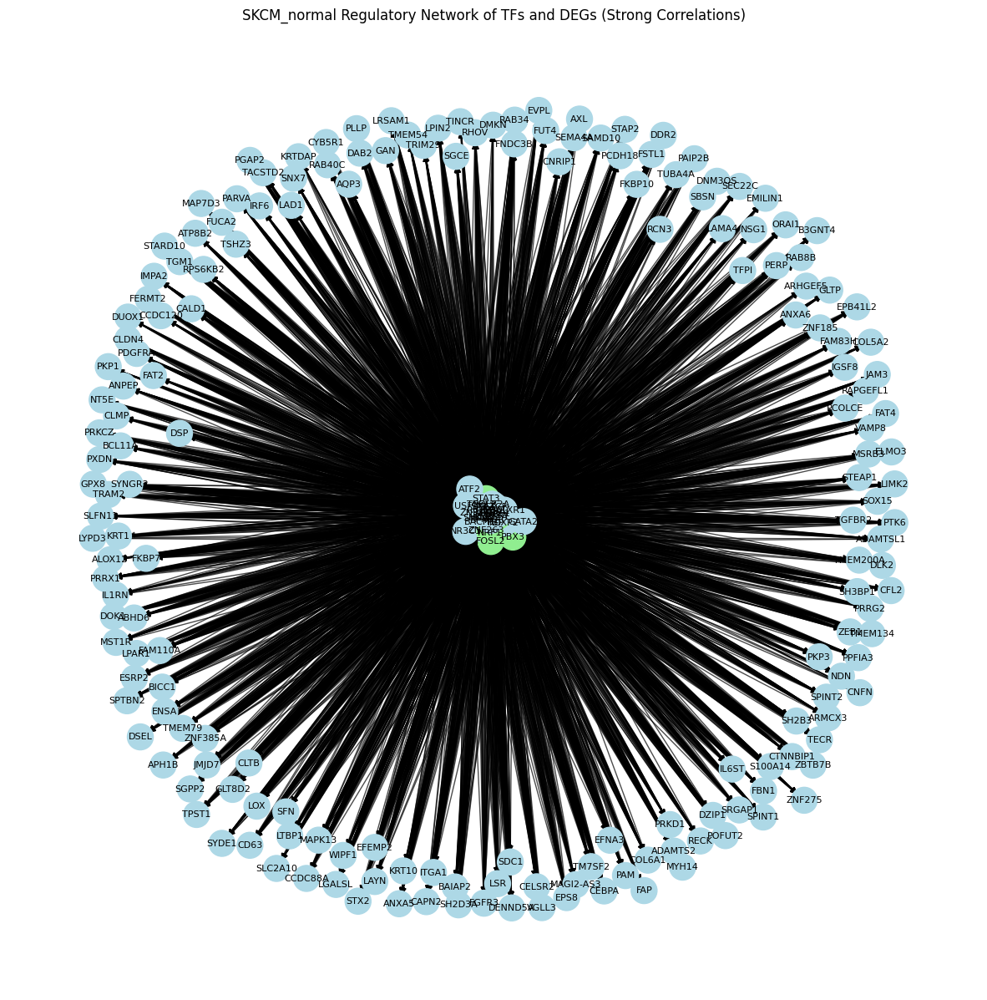

In [102]:
create_regulatory_network(SKCM_normal_strong_corr_df, list(SKCM_normal_significant_detfs['HGNC_symbol']), "SKCM_normal")


## Blood

In [103]:
LUAD_normal_samples = GTEX_phenotype[GTEX_phenotype["Primary_site"] == "Pancreas"]
LUAD_normal_samples.head(3)


,Unnamed: 0,Sample,Site_details,Primary_site,Gender,Patient,Cohort
2,18,GTEX_111CU_0526_SM_5EGHK,Pancreas,Pancreas,male,GTEX_111CU,GTEX
18,75,GTEX_111YS_1226_SM_5EGGJ,Pancreas,Pancreas,male,GTEX_111YS,GTEX
23,97,GTEX_1122O_0726_SM_5GIEV,Pancreas,Pancreas,female,GTEX_1122O,GTEX


In [104]:
LUAD_normal_samples_list = set(LUAD_normal_samples["Sample"].tolist())
LUAD_normal_samples_list = LUAD_normal_samples_list.intersection(available_normal_samples)
LUAD_normal_samples_list = list(LUAD_normal_samples_list)
len(LUAD_normal_samples_list), LUAD_normal_samples_list

(167,
 ['GTEX_WFJO_0626_SM_4LVMC',
  'GTEX_ZTPG_1026_SM_5DUWP',
  'GTEX_ZYW4_2126_SM_59HJ9',
  'GTEX_11I78_0626_SM_5A5LZ',
  'GTEX_QCQG_0426_SM_48U29',
  'GTEX_13FTW_0526_SM_5IFIP',
  'GTEX_ZEX8_1026_SM_4WKHE',
  'GTEX_11VI4_0426_SM_5EGHZ',
  'GTEX_XPVG_0326_SM_4B653',
  'GTEX_117YX_0226_SM_5EGH6',
  'GTEX_12WSG_1026_SM_5EGII',
  'GTEX_S4P3_0626_SM_4AD59',
  'GTEX_W5X1_0226_SM_5CHTO',
  'GTEX_ZF2S_0426_SM_4WKGP',
  'GTEX_ZYWO_1326_SM_5SI8X',
  'GTEX_VUSG_0326_SM_3GIJ7',
  'GTEX_YEC3_0626_SM_5IFHZ',
  'GTEX_ZYY3_0826_SM_5E44R',
  'GTEX_145ME_0326_SM_5S2QO',
  'GTEX_139YR_1526_SM_5IFJ1',
  'GTEX_Q2AH_0926_SM_48TZK',
  'GTEX_X3Y1_0726_SM_3P5YU',
  'GTEX_PW2O_0826_SM_48TC5',
  'GTEX_WH7G_0826_SM_4LVMR',
  'GTEX_RWS6_1126_SM_47JXC',
  'GTEX_R53T_0426_SM_48FEM',
  'GTEX_ZP4G_0426_SM_4YCER',
  'GTEX_WI4N_1826_SM_4OOSF',
  'GTEX_ZV7C_0726_SM_59HKH',
  'GTEX_PX3G_1026_SM_48TZW',
  'GTEX_ZC5H_0826_SM_5N9FH',
  'GTEX_ZVZP_0626_SM_59HL5',
  'GTEX_OOBJ_1026_SM_3NB2L',
  'GTEX_R55G_0326_SM_48FDM',
 

In [105]:
LUAD_normal_gene_expression_levels = ["Unnamed: 0", "HGNC_symbol"] + LUAD_normal_samples_list
LUAD_normal_gene_expression_levels = GTEX_rsem[LUAD_normal_gene_expression_levels]
LUAD_normal_gene_expression_levels = LUAD_normal_gene_expression_levels.set_index("Unnamed: 0")
LUAD_normal_gene_expression_levels.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,TSPAN6,2.8301,2.8522,3.0842,2.5561,3.4398,2.4675,2.5634,2.9655,2.8602,...,3.1028,3.5982,2.6255,2.3816,2.7636,3.1765,2.6232,2.9338,2.8321,2.9488
ENSG00000000005,TNMD,-9.9658,-9.9658,-5.0116,-5.0116,-1.7322,-9.9658,-5.5735,-2.2447,-9.9658,...,-1.9942,-9.9658,-9.9658,-4.6082,-9.9658,-4.2934,-5.0116,-9.9658,-6.5064,-2.4659
ENSG00000000419,DPM1,4.1294,4.3972,4.1228,3.4920,4.6089,3.8289,3.3017,3.8896,4.3060,...,4.4945,4.3321,4.2227,3.8837,4.4549,4.3256,4.2457,3.5312,4.1579,4.2510
ENSG00000000457,SCYL3,1.7575,1.5806,1.3623,0.9862,1.7532,1.0151,0.6050,1.0983,1.5563,...,1.6558,2.3816,1.3511,1.0711,1.5709,1.2815,1.4441,0.7579,0.5170,1.8036
ENSG00000000460,FIRRM,0.0580,-0.0725,-0.3383,-0.2845,-0.2671,-1.0262,-0.6416,-1.3183,-0.2328,...,-0.7834,1.0711,-0.3940,-0.8084,-0.1187,-0.2845,-0.1828,-0.8084,-1.1488,-0.2328


In [106]:
LUAD_normal_TF_expressions = LUAD_normal_gene_expression_levels[LUAD_normal_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
LUAD_normal_TF_expressions.shape
LUAD_normal_TF_expressions.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000006194,ZNF263,3.0825,3.1360,3.1045,2.5061,3.0481,2.6114,2.2813,2.5707,3.0859,...,2.9984,3.1844,2.6873,2.9205,2.7889,2.7615,2.8622,2.0254,2.2452,3.2870
ENSG00000012048,BRCA1,-0.5332,-0.5543,-0.7834,-0.6193,0.5170,-1.2142,-0.8084,-0.4131,-0.2671,...,-0.3940,1.0151,-0.4921,-1.1488,0.2029,-0.1993,0.1776,-1.1811,-0.8863,-0.2845
ENSG00000066135,KDM4A,2.1476,2.0844,1.0573,1.8524,2.2513,1.7532,1.7575,2.0111,2.2603,...,2.1766,2.8321,2.1766,1.6045,1.8036,2.2931,2.0004,1.5902,1.3735,2.1541
ENSG00000071564,TCF3,3.8857,4.3133,3.7539,3.2251,3.7794,3.2722,2.6510,3.6312,3.6113,...,3.4958,4.2056,3.3047,3.4596,3.7898,3.0791,3.5547,3.2389,2.9544,3.8591
ENSG00000073614,KDM5A,2.0535,1.8564,2.0325,1.4808,2.3280,1.3454,0.6332,1.3051,1.8564,...,2.1345,1.9034,1.9895,1.4011,1.5366,1.4494,1.7617,1.1641,1.0363,1.6045


In [107]:
LUAD_normal_high_MIR100HG_series, LUAD_normal_low_MIR100HG_series = extract_high_low_MIR100HG(LUAD_normal_gene_expression_levels)


In [108]:
LUAD_normal_results_df = detf_extraction(LUAD_normal_TF_expressions, LUAD_normal_high_MIR100HG_series, LUAD_normal_low_MIR100HG_series)


In [109]:
LUAD_normal_results_df["Adjusted P-value"] = multipletests(LUAD_normal_results_df["P-value"], method="fdr_bh")[1]

LUAD_normal_results_df["Adjusted P-value"] = pd.to_numeric(LUAD_normal_results_df["Adjusted P-value"], errors="coerce")

LUAD_normal_results_df = LUAD_normal_results_df.sort_values(by="Adjusted P-value", ascending=True)

LUAD_normal_significant_detfs = LUAD_normal_results_df[(LUAD_normal_results_df["Adjusted P-value"] < 0.01)]

LUAD_normal_significant_detfs = LUAD_normal_significant_detfs.sort_values(by="T-statistic", ascending=False)

LUAD_normal_significant_detfs.head(20), LUAD_normal_significant_detfs.shape

(         Ensembl_id HGNC_symbol  T-statistic   P-value  Adjusted P-value
 5   ENSG00000075426       FOSL2     4.775996  0.000005          0.000295
 31  ENSG00000134107     BHLHE40     4.228185  0.000047          0.001180
 32  ENSG00000136997         MYC     4.102805  0.000081          0.001180
 33  ENSG00000140262       TCF12     4.079728  0.000095          0.001180
 7   ENSG00000089902       RCOR1     4.000738  0.000126          0.001180
 45  ENSG00000172216       CEBPB     3.997500  0.000120          0.001180
 13  ENSG00000106459        NRF1     3.896001  0.000184          0.001305
 41  ENSG00000168610       STAT3     3.881812  0.000186          0.001305
 6   ENSG00000084093        REST     3.756670  0.000300          0.001613
 40  ENSG00000167081        PBX3     3.750395  0.000301          0.001613
 43  ENSG00000170345         FOS     3.697315  0.000317          0.001613
 18  ENSG00000113580       NR3C1     3.623766  0.000469          0.002190
 36  ENSG00000148737      TCF7L2     3

In [110]:
LUAD_normal_significant_detfs = LUAD_normal_significant_detfs.head(10)


In [111]:
LUAD_normal_top_degs = read_degs("../project/dsmp-2024-groupm22/files/LUAD_normal_results.csv")


In [112]:
LUAD_normal_detfs_target_dict = map_defts_targets(LUAD_normal_significant_detfs, LUAD_normal_top_degs)
print(LUAD_normal_detfs_target_dict)

{'PBX3': ['FUT3', 'TGFB3', 'PDLIM4', 'SFTPB', 'P2RY10', 'MSC', 'SEMA3A', 'FLNC', 'GAN', 'GADD45A', 'ZNF876P', 'ITGB8', 'SYTL2', 'HOTAIRM1', 'FRMD6', 'SAMD4A', 'SACS', 'HRH1', 'TMEM105', 'SRGAP1', 'DENND5B', 'GPAM', 'CREB3L2', 'VEPH1', 'STEAP2', 'HILPDA', 'STAT4', 'PDE7B', 'RASGRF1', 'ARID5A', 'DCLK2', 'PRRX1', 'GNRH1', 'NAPSA', 'FAM171B', 'TSLP', 'FREM2', 'G0S2', 'HAPLN3', 'DACT1', 'DACT3', 'PXMP4', 'PLA2G4F', 'LRRK2', 'ZBTB32', 'NCMAP', 'PI16', 'ADAM19', 'PLCB1'], 'NR3C1': ['GADD45A', 'CPB2', 'SMPDL3B', 'ITGB8', 'ABCA3', 'PEBP4', 'PTGS2', 'HRH1', 'TMEM105', 'LGI3', 'SRGAP1', 'DENND5B', 'GPAM', 'CREB3L2', 'VEPH1', 'HILPDA', 'DCLK2', 'KLHDC7A', 'LRRK2', 'ROS1', 'EPDR1', 'PGC'], 'STAT3': ['LSS', 'CFAP69', 'SMPDL3B', 'ITGB8', 'FRMD6', 'SAMD4A', 'PROX1', 'MAP3K7CL', 'SRGAP1', 'DENND5B', 'STEAP2', 'NAPSA', 'FAM171B', 'ENTPD3', 'PPM1J', 'DACT1', 'SFTPD', 'SFTPA2', 'ZBTB32', 'PI16', 'SLCO5A1', 'GOLT1A', 'PCDHAC1', 'TGFB3', 'CCDC141', 'P2RY10', 'SEMA3A', 'CPB2', 'PTGS2', 'PLA2G3', 'TMEM105', '

In [113]:
LUAD_normal_gene_expression_levels = LUAD_normal_gene_expression_levels.reset_index()


In [114]:
LUAD_normal_expressions_df = LUAD_normal_gene_expression_levels.drop(columns=["Unnamed: 0"])
LUAD_normal_expressions_df = LUAD_normal_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")


In [115]:
LUAD_normal_correlation_df = get_correlation_df(LUAD_normal_detfs_target_dict, LUAD_normal_expressions_df)
LUAD_normal_strong_corr_df = LUAD_normal_correlation_df[LUAD_normal_correlation_df["Correlation"].abs() > 0.5]
LUAD_normal_strong_corr_df

,TF,Target,Correlation
0,PBX3,FUT3,0.855270
1,PBX3,TGFB3,0.835067
2,PBX3,PDLIM4,0.819387
5,PBX3,MSC,0.761295
7,PBX3,FLNC,0.763852
...,...,...,...
2981,CHD2,TMEM97,0.897073
2982,CHD2,ZNF385D,0.629623
2983,CHD2,EPDR1,-0.632853
2984,CHD2,TMEM163,0.858097


LUAD_normal Network has 154 nodes and 2413 edges.
Top hub TFs: [('TCF12', 0.5620915032679739), ('REST', 0.5294117647058824), ('STAT3', 0.4901960784313726), ('NRF1', 0.3137254901960784), ('PBX3', 0.28104575163398693), ('FOSL2', 0.26143790849673204)]


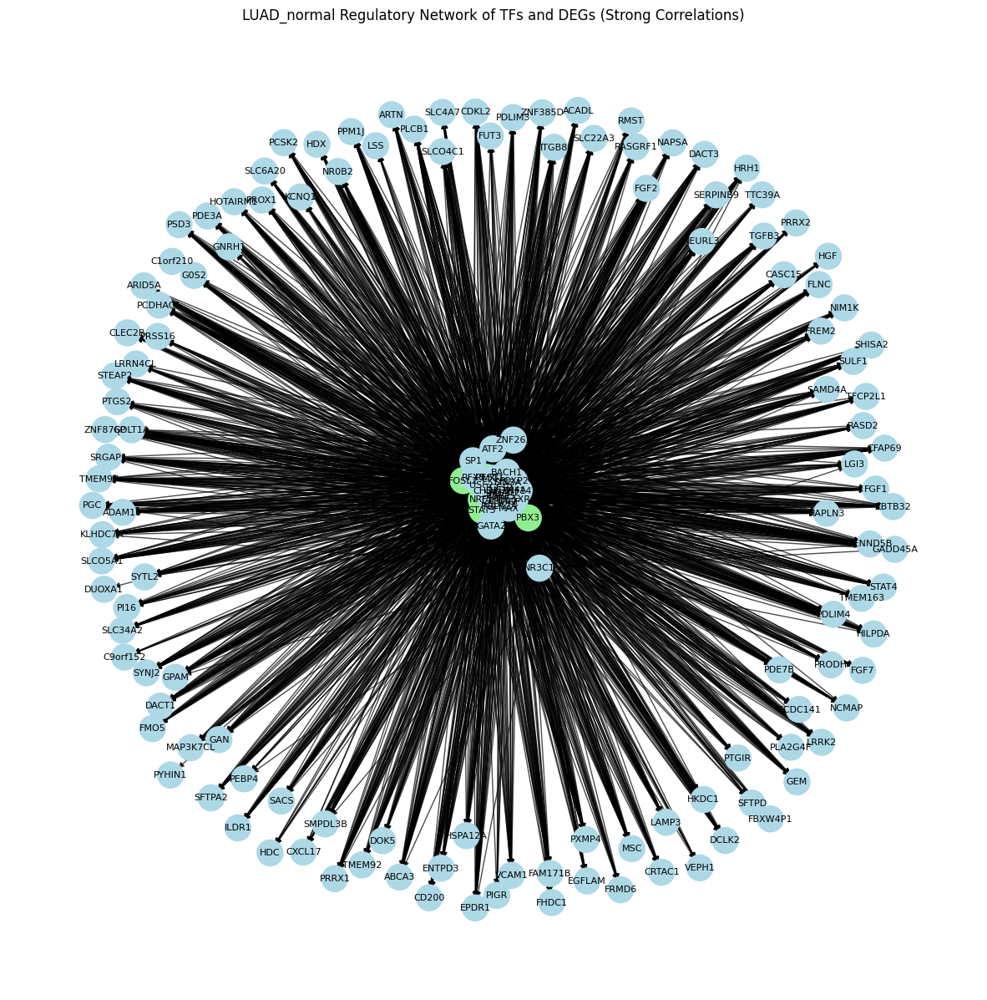

In [116]:
create_regulatory_network(LUAD_normal_strong_corr_df, list(LUAD_normal_significant_detfs['HGNC_symbol']), "LUAD_normal")


## Prostate

In [117]:
PRAD_normal_samples = GTEX_phenotype[GTEX_phenotype["Primary_site"] == "Pancreas"]
PRAD_normal_samples.head(3)

,Unnamed: 0,Sample,Site_details,Primary_site,Gender,Patient,Cohort
2,18,GTEX_111CU_0526_SM_5EGHK,Pancreas,Pancreas,male,GTEX_111CU,GTEX
18,75,GTEX_111YS_1226_SM_5EGGJ,Pancreas,Pancreas,male,GTEX_111YS,GTEX
23,97,GTEX_1122O_0726_SM_5GIEV,Pancreas,Pancreas,female,GTEX_1122O,GTEX


In [118]:
PRAD_normal_samples_list = set(PRAD_normal_samples["Sample"].tolist())
PRAD_normal_samples_list = PRAD_normal_samples_list.intersection(available_normal_samples)
PRAD_normal_samples_list = list(PRAD_normal_samples_list)
len(PRAD_normal_samples_list), PRAD_normal_samples_list

(167,
 ['GTEX_WFJO_0626_SM_4LVMC',
  'GTEX_ZTPG_1026_SM_5DUWP',
  'GTEX_ZYW4_2126_SM_59HJ9',
  'GTEX_11I78_0626_SM_5A5LZ',
  'GTEX_QCQG_0426_SM_48U29',
  'GTEX_13FTW_0526_SM_5IFIP',
  'GTEX_ZEX8_1026_SM_4WKHE',
  'GTEX_11VI4_0426_SM_5EGHZ',
  'GTEX_XPVG_0326_SM_4B653',
  'GTEX_117YX_0226_SM_5EGH6',
  'GTEX_12WSG_1026_SM_5EGII',
  'GTEX_S4P3_0626_SM_4AD59',
  'GTEX_W5X1_0226_SM_5CHTO',
  'GTEX_ZF2S_0426_SM_4WKGP',
  'GTEX_ZYWO_1326_SM_5SI8X',
  'GTEX_VUSG_0326_SM_3GIJ7',
  'GTEX_YEC3_0626_SM_5IFHZ',
  'GTEX_ZYY3_0826_SM_5E44R',
  'GTEX_145ME_0326_SM_5S2QO',
  'GTEX_139YR_1526_SM_5IFJ1',
  'GTEX_Q2AH_0926_SM_48TZK',
  'GTEX_X3Y1_0726_SM_3P5YU',
  'GTEX_PW2O_0826_SM_48TC5',
  'GTEX_WH7G_0826_SM_4LVMR',
  'GTEX_RWS6_1126_SM_47JXC',
  'GTEX_R53T_0426_SM_48FEM',
  'GTEX_ZP4G_0426_SM_4YCER',
  'GTEX_WI4N_1826_SM_4OOSF',
  'GTEX_ZV7C_0726_SM_59HKH',
  'GTEX_PX3G_1026_SM_48TZW',
  'GTEX_ZC5H_0826_SM_5N9FH',
  'GTEX_ZVZP_0626_SM_59HL5',
  'GTEX_OOBJ_1026_SM_3NB2L',
  'GTEX_R55G_0326_SM_48FDM',
 

In [119]:
PRAD_normal_gene_expression_levels = ["Unnamed: 0", "HGNC_symbol"] + PRAD_normal_samples_list
PRAD_normal_gene_expression_levels = GTEX_rsem[PRAD_normal_gene_expression_levels]
PRAD_normal_gene_expression_levels = PRAD_normal_gene_expression_levels.set_index("Unnamed: 0")
PRAD_normal_gene_expression_levels.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,TSPAN6,2.8301,2.8522,3.0842,2.5561,3.4398,2.4675,2.5634,2.9655,2.8602,...,3.1028,3.5982,2.6255,2.3816,2.7636,3.1765,2.6232,2.9338,2.8321,2.9488
ENSG00000000005,TNMD,-9.9658,-9.9658,-5.0116,-5.0116,-1.7322,-9.9658,-5.5735,-2.2447,-9.9658,...,-1.9942,-9.9658,-9.9658,-4.6082,-9.9658,-4.2934,-5.0116,-9.9658,-6.5064,-2.4659
ENSG00000000419,DPM1,4.1294,4.3972,4.1228,3.4920,4.6089,3.8289,3.3017,3.8896,4.3060,...,4.4945,4.3321,4.2227,3.8837,4.4549,4.3256,4.2457,3.5312,4.1579,4.2510
ENSG00000000457,SCYL3,1.7575,1.5806,1.3623,0.9862,1.7532,1.0151,0.6050,1.0983,1.5563,...,1.6558,2.3816,1.3511,1.0711,1.5709,1.2815,1.4441,0.7579,0.5170,1.8036
ENSG00000000460,FIRRM,0.0580,-0.0725,-0.3383,-0.2845,-0.2671,-1.0262,-0.6416,-1.3183,-0.2328,...,-0.7834,1.0711,-0.3940,-0.8084,-0.1187,-0.2845,-0.1828,-0.8084,-1.1488,-0.2328


In [120]:
PRAD_normal_TF_expressions = PRAD_normal_gene_expression_levels[PRAD_normal_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
PRAD_normal_TF_expressions.shape
PRAD_normal_TF_expressions.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000006194,ZNF263,3.0825,3.1360,3.1045,2.5061,3.0481,2.6114,2.2813,2.5707,3.0859,...,2.9984,3.1844,2.6873,2.9205,2.7889,2.7615,2.8622,2.0254,2.2452,3.2870
ENSG00000012048,BRCA1,-0.5332,-0.5543,-0.7834,-0.6193,0.5170,-1.2142,-0.8084,-0.4131,-0.2671,...,-0.3940,1.0151,-0.4921,-1.1488,0.2029,-0.1993,0.1776,-1.1811,-0.8863,-0.2845
ENSG00000066135,KDM4A,2.1476,2.0844,1.0573,1.8524,2.2513,1.7532,1.7575,2.0111,2.2603,...,2.1766,2.8321,2.1766,1.6045,1.8036,2.2931,2.0004,1.5902,1.3735,2.1541
ENSG00000071564,TCF3,3.8857,4.3133,3.7539,3.2251,3.7794,3.2722,2.6510,3.6312,3.6113,...,3.4958,4.2056,3.3047,3.4596,3.7898,3.0791,3.5547,3.2389,2.9544,3.8591
ENSG00000073614,KDM5A,2.0535,1.8564,2.0325,1.4808,2.3280,1.3454,0.6332,1.3051,1.8564,...,2.1345,1.9034,1.9895,1.4011,1.5366,1.4494,1.7617,1.1641,1.0363,1.6045


In [121]:
PRAD_normal_high_MIR100HG_series, PRAD_normal_low_MIR100HG_series = extract_high_low_MIR100HG(PRAD_normal_gene_expression_levels)


In [122]:
PRAD_normal_results_df = detf_extraction(PRAD_normal_TF_expressions, PRAD_normal_high_MIR100HG_series, PRAD_normal_low_MIR100HG_series)


In [123]:
PRAD_normal_results_df["Adjusted P-value"] = multipletests(PRAD_normal_results_df["P-value"], method="fdr_bh")[1]

PRAD_normal_results_df["Adjusted P-value"] = pd.to_numeric(PRAD_normal_results_df["Adjusted P-value"], errors="coerce")

PRAD_normal_results_df = PRAD_normal_results_df.sort_values(by="Adjusted P-value", ascending=True)

PRAD_normal_significant_detfs = PRAD_normal_results_df[(PRAD_normal_results_df["Adjusted P-value"] < 0.01)]

PRAD_normal_significant_detfs = PRAD_normal_significant_detfs.sort_values(by="T-statistic", ascending=False)

PRAD_normal_significant_detfs.head(20), PRAD_normal_significant_detfs.shape


(         Ensembl_id HGNC_symbol  T-statistic   P-value  Adjusted P-value
 5   ENSG00000075426       FOSL2     4.775996  0.000005          0.000295
 31  ENSG00000134107     BHLHE40     4.228185  0.000047          0.001180
 32  ENSG00000136997         MYC     4.102805  0.000081          0.001180
 33  ENSG00000140262       TCF12     4.079728  0.000095          0.001180
 7   ENSG00000089902       RCOR1     4.000738  0.000126          0.001180
 45  ENSG00000172216       CEBPB     3.997500  0.000120          0.001180
 13  ENSG00000106459        NRF1     3.896001  0.000184          0.001305
 41  ENSG00000168610       STAT3     3.881812  0.000186          0.001305
 6   ENSG00000084093        REST     3.756670  0.000300          0.001613
 40  ENSG00000167081        PBX3     3.750395  0.000301          0.001613
 43  ENSG00000170345         FOS     3.697315  0.000317          0.001613
 18  ENSG00000113580       NR3C1     3.623766  0.000469          0.002190
 36  ENSG00000148737      TCF7L2     3

In [124]:
PRAD_normal_significant_detfs = PRAD_normal_significant_detfs.head(10)


In [125]:
PRAD_normal_top_degs = read_degs("../project/dsmp-2024-groupm22/files/PRAD_normal_results.csv")


In [126]:
PRAD_normal_detfs_target_dict = map_defts_targets(PRAD_normal_significant_detfs, PRAD_normal_top_degs)
print(PRAD_normal_detfs_target_dict)

{'PBX3': ['DCN', 'DCXR', 'SYNGR2', 'ZNF697', 'GOT2', 'CNDP2', 'SLIT2', 'ATP6AP1', 'ZCCHC24', 'NFATC4', 'PEAK1', 'CLCN3', 'GPRC5C', 'CORO1B', 'ZEB2', 'COG3', 'DOLPP1', 'NANS', 'EFEMP2', 'ANK2', 'UQCC3', 'EPB41L2', 'GSTZ1', 'BICC1', 'ARHGAP21', 'SFXN2', 'DNM3OS', 'RHOJ', 'MAGI2-AS3', 'FLRT2', 'GFPT2', 'CTIF', 'FGFR1', 'NEDD4L', 'ZNF438', 'CCDC102A', 'LGALS1', 'MB21D2', 'TMSB4X', 'EMILIN1', 'COL5A1', 'SNX22', 'LPCAT3', 'CYB561D2', 'DCLK2', 'TDRKH', 'NAP1L1', 'EMP3', 'RAP2A', 'CNRIP1', 'TSTD1', 'CENPN', 'LRRK2', 'NAPA', 'DDR2', 'SEC11C', 'AGPAT4', 'ST6GALNAC6', 'ARHGEF6', 'ACOX1', 'LOXL3', 'MFAP4', 'ZEB1', 'STX2', 'GYPC', 'SLC15A3', 'ZEB1-AS1', 'TSHZ3', 'REEP6', 'CASZ1', 'GAB2', 'VIM', 'ZNF552', 'MPDU1', 'GCAT', 'ZDHHC12', 'SLC25A16', 'SLC39A6', 'PC', 'PCSK5', 'DCAF11', 'GSN', 'BEND6', 'CCND2', 'PPP1CA'], 'NR3C1': ['CTIF', 'TXNRD2', 'SPTBN1', 'EFEMP2', 'COL14A1', 'MAP7', 'SLC16A4', 'CMTM3', 'TMSB4X', 'PDLIM2', 'GPRC5C', 'VAMP5', 'DCLK2', 'BICC1', 'VIM', 'PC', 'LRRK2', 'NAPA', 'PCSK5', 'RAS

In [127]:
PRAD_normal_gene_expression_levels = PRAD_normal_gene_expression_levels.reset_index()


In [128]:
PRAD_normal_expressions_df = PRAD_normal_gene_expression_levels.drop(columns=["Unnamed: 0"])
PRAD_normal_expressions_df = PRAD_normal_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")

In [129]:
PRAD_normal_correlation_df = get_correlation_df(PRAD_normal_detfs_target_dict, PRAD_normal_expressions_df)
PRAD_normal_strong_corr_df = PRAD_normal_correlation_df[PRAD_normal_correlation_df["Correlation"].abs() > 0.5]
PRAD_normal_strong_corr_df

,TF,Target,Correlation
0,PBX3,DCN,0.904409
1,PBX3,DCXR,0.928555
2,PBX3,SYNGR2,0.933912
3,PBX3,ZNF697,0.917314
4,PBX3,GOT2,0.954606
...,...,...,...
4033,CHD2,DCAF11,0.937496
4034,CHD2,GSN,0.931136
4036,CHD2,CCND2,0.905352
4037,CHD2,PPP1CA,0.949836


PRAD_normal Network has 199 nodes and 3916 edges.
Top hub TFs: [('TCF12', 0.7424242424242425), ('REST', 0.7222222222222223), ('STAT3', 0.595959595959596), ('NRF1', 0.5), ('PBX3', 0.42929292929292934), ('FOSL2', 0.3383838383838384)]


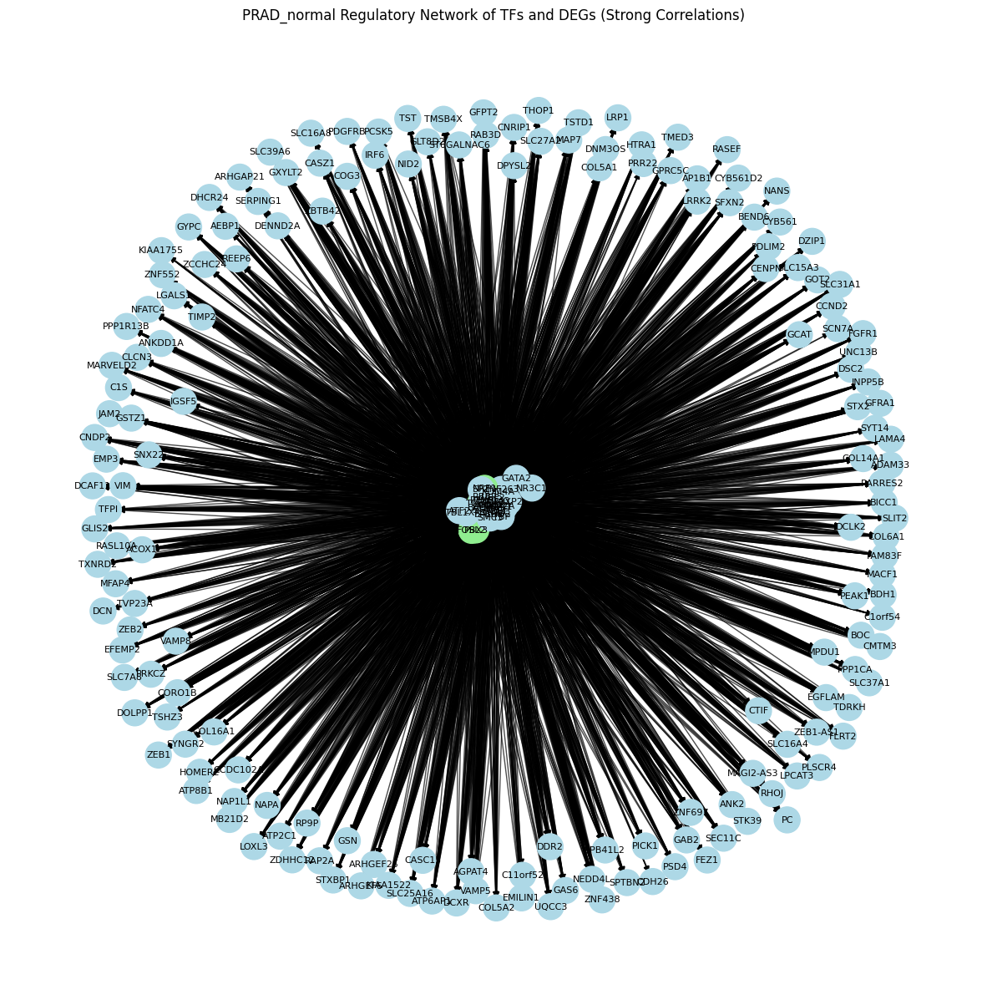

In [130]:
create_regulatory_network(PRAD_normal_strong_corr_df, list(PRAD_normal_significant_detfs['HGNC_symbol']), "PRAD_normal")


## Stomach

In [131]:
STAD_normal_samples = GTEX_phenotype[GTEX_phenotype["Primary_site"] == "Pancreas"]
STAD_normal_samples.head(3)

,Unnamed: 0,Sample,Site_details,Primary_site,Gender,Patient,Cohort
2,18,GTEX_111CU_0526_SM_5EGHK,Pancreas,Pancreas,male,GTEX_111CU,GTEX
18,75,GTEX_111YS_1226_SM_5EGGJ,Pancreas,Pancreas,male,GTEX_111YS,GTEX
23,97,GTEX_1122O_0726_SM_5GIEV,Pancreas,Pancreas,female,GTEX_1122O,GTEX


In [132]:
STAD_normal_samples_list = set(STAD_normal_samples["Sample"].tolist())
STAD_normal_samples_list = STAD_normal_samples_list.intersection(available_normal_samples)
STAD_normal_samples_list = list(STAD_normal_samples_list)
len(STAD_normal_samples_list), STAD_normal_samples_list

(167,
 ['GTEX_WFJO_0626_SM_4LVMC',
  'GTEX_ZTPG_1026_SM_5DUWP',
  'GTEX_ZYW4_2126_SM_59HJ9',
  'GTEX_11I78_0626_SM_5A5LZ',
  'GTEX_QCQG_0426_SM_48U29',
  'GTEX_13FTW_0526_SM_5IFIP',
  'GTEX_ZEX8_1026_SM_4WKHE',
  'GTEX_11VI4_0426_SM_5EGHZ',
  'GTEX_XPVG_0326_SM_4B653',
  'GTEX_117YX_0226_SM_5EGH6',
  'GTEX_12WSG_1026_SM_5EGII',
  'GTEX_S4P3_0626_SM_4AD59',
  'GTEX_W5X1_0226_SM_5CHTO',
  'GTEX_ZF2S_0426_SM_4WKGP',
  'GTEX_ZYWO_1326_SM_5SI8X',
  'GTEX_VUSG_0326_SM_3GIJ7',
  'GTEX_YEC3_0626_SM_5IFHZ',
  'GTEX_ZYY3_0826_SM_5E44R',
  'GTEX_145ME_0326_SM_5S2QO',
  'GTEX_139YR_1526_SM_5IFJ1',
  'GTEX_Q2AH_0926_SM_48TZK',
  'GTEX_X3Y1_0726_SM_3P5YU',
  'GTEX_PW2O_0826_SM_48TC5',
  'GTEX_WH7G_0826_SM_4LVMR',
  'GTEX_RWS6_1126_SM_47JXC',
  'GTEX_R53T_0426_SM_48FEM',
  'GTEX_ZP4G_0426_SM_4YCER',
  'GTEX_WI4N_1826_SM_4OOSF',
  'GTEX_ZV7C_0726_SM_59HKH',
  'GTEX_PX3G_1026_SM_48TZW',
  'GTEX_ZC5H_0826_SM_5N9FH',
  'GTEX_ZVZP_0626_SM_59HL5',
  'GTEX_OOBJ_1026_SM_3NB2L',
  'GTEX_R55G_0326_SM_48FDM',
 

In [133]:
STAD_normal_gene_expression_levels = ["Unnamed: 0", "HGNC_symbol"] + STAD_normal_samples_list
STAD_normal_gene_expression_levels = GTEX_rsem[STAD_normal_gene_expression_levels]
STAD_normal_gene_expression_levels = STAD_normal_gene_expression_levels.set_index("Unnamed: 0")
STAD_normal_gene_expression_levels.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,TSPAN6,2.8301,2.8522,3.0842,2.5561,3.4398,2.4675,2.5634,2.9655,2.8602,...,3.1028,3.5982,2.6255,2.3816,2.7636,3.1765,2.6232,2.9338,2.8321,2.9488
ENSG00000000005,TNMD,-9.9658,-9.9658,-5.0116,-5.0116,-1.7322,-9.9658,-5.5735,-2.2447,-9.9658,...,-1.9942,-9.9658,-9.9658,-4.6082,-9.9658,-4.2934,-5.0116,-9.9658,-6.5064,-2.4659
ENSG00000000419,DPM1,4.1294,4.3972,4.1228,3.4920,4.6089,3.8289,3.3017,3.8896,4.3060,...,4.4945,4.3321,4.2227,3.8837,4.4549,4.3256,4.2457,3.5312,4.1579,4.2510
ENSG00000000457,SCYL3,1.7575,1.5806,1.3623,0.9862,1.7532,1.0151,0.6050,1.0983,1.5563,...,1.6558,2.3816,1.3511,1.0711,1.5709,1.2815,1.4441,0.7579,0.5170,1.8036
ENSG00000000460,FIRRM,0.0580,-0.0725,-0.3383,-0.2845,-0.2671,-1.0262,-0.6416,-1.3183,-0.2328,...,-0.7834,1.0711,-0.3940,-0.8084,-0.1187,-0.2845,-0.1828,-0.8084,-1.1488,-0.2328


In [134]:
STAD_normal_TF_expressions = STAD_normal_gene_expression_levels[STAD_normal_gene_expression_levels["HGNC_symbol"].isin(TF_MIR100HG_list)]
STAD_normal_TF_expressions.shape
STAD_normal_TF_expressions.head()

,HGNC_symbol,GTEX_WFJO_0626_SM_4LVMC,GTEX_ZTPG_1026_SM_5DUWP,GTEX_ZYW4_2126_SM_59HJ9,GTEX_11I78_0626_SM_5A5LZ,GTEX_QCQG_0426_SM_48U29,GTEX_13FTW_0526_SM_5IFIP,GTEX_ZEX8_1026_SM_4WKHE,GTEX_11VI4_0426_SM_5EGHZ,GTEX_XPVG_0326_SM_4B653,...,GTEX_ZYFG_0826_SM_5BC5T,GTEX_WFON_0626_SM_4LVLX,GTEX_YEC3_0626_SM_4YCFE,GTEX_ZG7Y_0326_SM_4WWEY,GTEX_13W3W_1026_SM_5IFG4,GTEX_146FR_0126_SM_5Q5F3,GTEX_WHSB_0726_SM_4M1XQ,GTEX_Y5V5_1026_SM_5LUAH,GTEX_YF7O_1326_SM_4W1ZR,GTEX_VJYA_0826_SM_4KL1M
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ENSG00000006194,ZNF263,3.0825,3.1360,3.1045,2.5061,3.0481,2.6114,2.2813,2.5707,3.0859,...,2.9984,3.1844,2.6873,2.9205,2.7889,2.7615,2.8622,2.0254,2.2452,3.2870
ENSG00000012048,BRCA1,-0.5332,-0.5543,-0.7834,-0.6193,0.5170,-1.2142,-0.8084,-0.4131,-0.2671,...,-0.3940,1.0151,-0.4921,-1.1488,0.2029,-0.1993,0.1776,-1.1811,-0.8863,-0.2845
ENSG00000066135,KDM4A,2.1476,2.0844,1.0573,1.8524,2.2513,1.7532,1.7575,2.0111,2.2603,...,2.1766,2.8321,2.1766,1.6045,1.8036,2.2931,2.0004,1.5902,1.3735,2.1541
ENSG00000071564,TCF3,3.8857,4.3133,3.7539,3.2251,3.7794,3.2722,2.6510,3.6312,3.6113,...,3.4958,4.2056,3.3047,3.4596,3.7898,3.0791,3.5547,3.2389,2.9544,3.8591
ENSG00000073614,KDM5A,2.0535,1.8564,2.0325,1.4808,2.3280,1.3454,0.6332,1.3051,1.8564,...,2.1345,1.9034,1.9895,1.4011,1.5366,1.4494,1.7617,1.1641,1.0363,1.6045


In [135]:
STAD_normal_high_MIR100HG_series, STAD_normal_low_MIR100HG_series = extract_high_low_MIR100HG(STAD_normal_gene_expression_levels)


In [136]:
STAD_normal_results_df = detf_extraction(STAD_normal_TF_expressions, STAD_normal_high_MIR100HG_series, STAD_normal_low_MIR100HG_series)


In [137]:
STAD_normal_results_df["Adjusted P-value"] = multipletests(STAD_normal_results_df["P-value"], method="fdr_bh")[1]

STAD_normal_results_df["Adjusted P-value"] = pd.to_numeric(STAD_normal_results_df["Adjusted P-value"], errors="coerce")

STAD_normal_results_df = STAD_normal_results_df.sort_values(by="Adjusted P-value", ascending=True)

STAD_normal_significant_detfs = STAD_normal_results_df[(STAD_normal_results_df["Adjusted P-value"] < 0.01)]

STAD_normal_significant_detfs = STAD_normal_significant_detfs.sort_values(by="T-statistic", ascending=False)

STAD_normal_significant_detfs.head(20), STAD_normal_significant_detfs.shape


(         Ensembl_id HGNC_symbol  T-statistic   P-value  Adjusted P-value
 5   ENSG00000075426       FOSL2     4.775996  0.000005          0.000295
 31  ENSG00000134107     BHLHE40     4.228185  0.000047          0.001180
 32  ENSG00000136997         MYC     4.102805  0.000081          0.001180
 33  ENSG00000140262       TCF12     4.079728  0.000095          0.001180
 7   ENSG00000089902       RCOR1     4.000738  0.000126          0.001180
 45  ENSG00000172216       CEBPB     3.997500  0.000120          0.001180
 13  ENSG00000106459        NRF1     3.896001  0.000184          0.001305
 41  ENSG00000168610       STAT3     3.881812  0.000186          0.001305
 6   ENSG00000084093        REST     3.756670  0.000300          0.001613
 40  ENSG00000167081        PBX3     3.750395  0.000301          0.001613
 43  ENSG00000170345         FOS     3.697315  0.000317          0.001613
 18  ENSG00000113580       NR3C1     3.623766  0.000469          0.002190
 36  ENSG00000148737      TCF7L2     3

In [138]:
STAD_normal_significant_detfs = STAD_normal_significant_detfs.head(10)


In [139]:
STAD_normal_top_degs = read_degs("../project/dsmp-2024-groupm22/files/STAD_normal_results.csv")


In [140]:
STAD_normal_detfs_target_dict = map_defts_targets(STAD_normal_significant_detfs, STAD_normal_top_degs)
print(STAD_normal_detfs_target_dict)


{'PBX3': ['CNTN1', 'PTGFR', 'EPHA7', 'SEMA3A', 'FLNC', 'SSC5D', 'ALDH3A1', 'HAND2-AS1', 'SYT1', 'STAC', 'HNF1B', 'PNCK', 'THBS2', 'CAP2', 'HAND2', 'SULT1E1', 'ASPN', 'PRRX1', 'COL4A6', 'PLA2G10', 'SYNM', 'IGSF9B', 'BNC2', 'LAYN', 'PLA2G4F', 'NCS1', 'INHBA', 'NRXN2', 'DGKB', 'PCDH10', 'PCP4L1', 'ASB5', 'SFRP1', 'COL19A1', 'NGB'], 'NR3C1': ['ADRA1D', 'FILIP1', 'PLA2G10', 'NRXN3', 'THBS2', 'BNC2', 'SLC26A9', 'ASB5', 'KCNJ16', 'SCGB2A1', 'KLHDC7A', 'ALDH3A1', 'PTGS2', 'CTNNA3', 'SULT1E1'], 'STAT3': ['FGF2', 'PDGFRL', 'TMCO5A', 'GLOD5', 'CTXN1', 'CNTN1', 'PTGFR', 'PDE3A', 'CAPN9', 'EVPLL', 'GJC2', 'SEMA3A', 'SSC5D', 'KCNJ16', 'ABCC9', 'ALDH3A1', 'LPAR4', 'PTGS2', 'FGF10', 'SYT1', 'OR7E91P', 'FILIP1', 'SOWAHB', 'SCRG1', 'ABI3BP', 'CAP2', 'PCOLCE2', 'COL8A1', 'RAB19', 'RNF150', 'TMPRSS7', 'SULT1E1', 'ASPN', 'MCIDAS', 'MMP16', 'NRK', 'COL4A6', 'UGT1A1', 'PIK3C2G', 'LAYN', 'GGT6', 'COL21A1', 'EPHA6', 'PDZRN4', 'KLHDC7A', 'PLA2G4F', 'FAT3', 'INHBA', 'SLC9A2', 'DGKB', 'NRXN3', 'PGR', 'ASB2', 'SFR

In [141]:
STAD_normal_gene_expression_levels = STAD_normal_gene_expression_levels.reset_index()


In [142]:
STAD_normal_expressions_df = STAD_normal_gene_expression_levels.drop(columns=["Unnamed: 0"])
STAD_normal_expressions_df = STAD_normal_expressions_df.dropna(subset=["HGNC_symbol"]).set_index("HGNC_symbol")

In [143]:
STAD_normal_correlation_df = get_correlation_df(STAD_normal_detfs_target_dict, STAD_normal_expressions_df)
STAD_normal_strong_corr_df = STAD_normal_correlation_df[STAD_normal_correlation_df["Correlation"].abs() > 0.5]
STAD_normal_strong_corr_df

,TF,Target,Correlation
0,PBX3,CNTN1,0.831525
1,PBX3,PTGFR,0.823433
4,PBX3,FLNC,0.763852
5,PBX3,SSC5D,0.798772
6,PBX3,ALDH3A1,0.522172
...,...,...,...
2305,CHD2,ACTN2,0.858602
2306,CHD2,AKAP6,0.702205
2310,CHD2,RAB19,0.741907
2311,CHD2,RASAL1,0.798770


STAD_normal Network has 125 nodes and 1595 edges.
Top hub TFs: [('TCF12', 0.4758064516129032), ('REST', 0.4435483870967742), ('STAT3', 0.3387096774193548), ('PBX3', 0.2096774193548387), ('FOSL2', 0.14516129032258063), ('NRF1', 0.12903225806451613)]


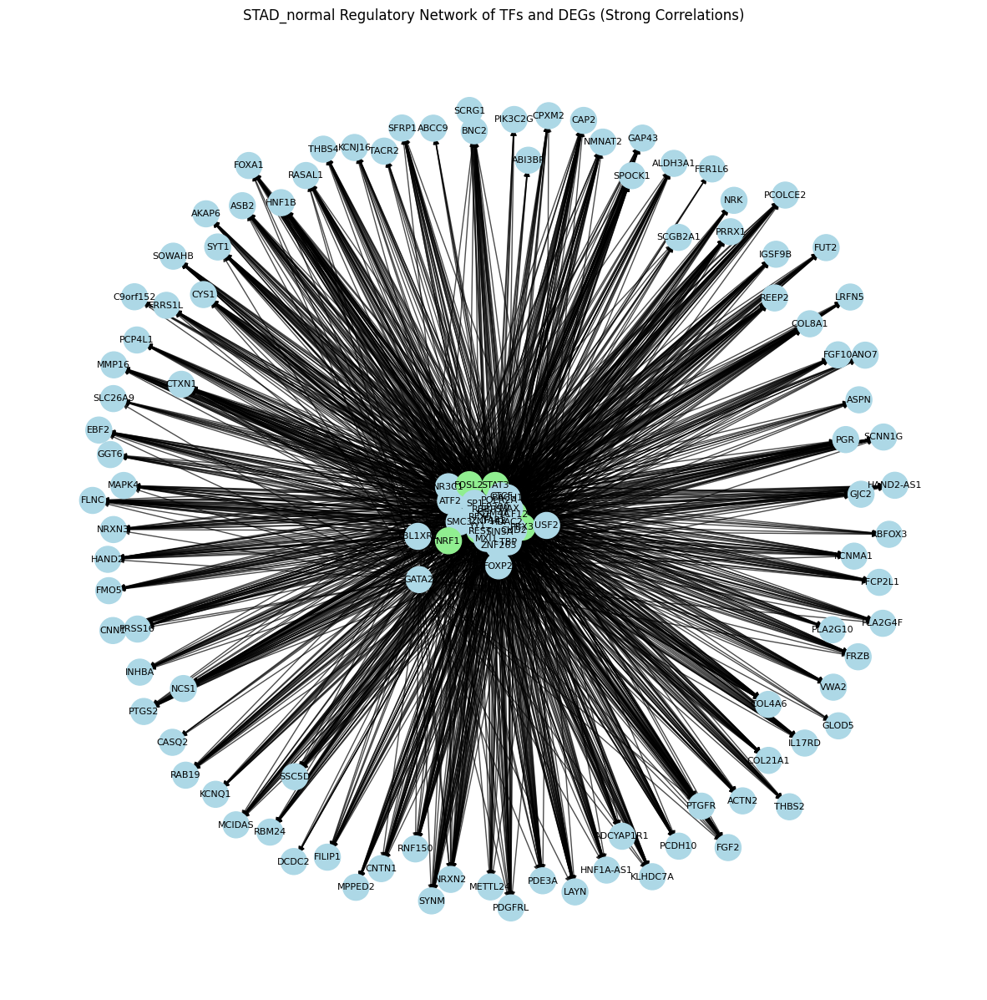

In [144]:
create_regulatory_network(STAD_normal_strong_corr_df, list(STAD_normal_significant_detfs['HGNC_symbol']), "STAD_normal")


## HeatMap 

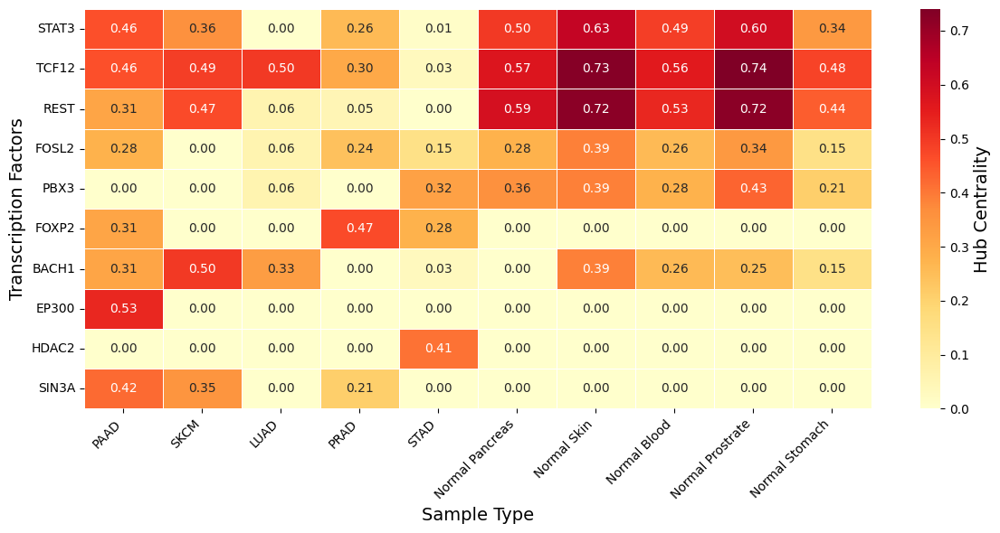

In [150]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

data = {
    'PAAD':     {'STAT3': 0.46, 'FOXP2': 0.31, 'BACH1': 0.31, 'TCF12': 0.46, 'REST': 0.31, 'EP300': 0.53, 'HDAC2': 0,    'PBX3': 0,    'FOSL2': 0.28, 'SIN3A': 0.42},
    'SKCM':     {'STAT3': 0.36, 'FOXP2': 0,    'BACH1': 0.50, 'TCF12': 0.49, 'REST': 0.47, 'EP300': 0,    'HDAC2': 0,    'PBX3': 0,    'FOSL2': 0,    'SIN3A': 0.35},
    'LUAD':     {'STAT3': 0,    'FOXP2': 0,    'BACH1': 0.33, 'TCF12': 0.50, 'REST': 0.06, 'EP300': 0,    'HDAC2': 0,    'PBX3': 0.06, 'FOSL2': 0.06, 'SIN3A': 0},
    'PRAD':     {'STAT3': 0.26, 'FOXP2': 0.47, 'BACH1': 0,    'TCF12': 0.30, 'REST': 0.05, 'EP300': 0,    'HDAC2': 0,    'PBX3': 0,    'FOSL2': 0.24, 'SIN3A': 0.21},
    'STAD':     {'STAT3': 0.01, 'FOXP2': 0.28, 'BACH1': 0.03, 'TCF12': 0.03, 'REST': 0,    'EP300': 0,    'HDAC2': 0.41, 'PBX3': 0.32, 'FOSL2': 0.15, 'SIN3A': 0},

    'Normal Pancreas': {'STAT3': 0.50, 'FOXP2': 0, 'BACH1': 0, 'TCF12': 0.57, 'REST': 0.59, 'EP300': 0, 'HDAC2': 0, 'PBX3': 0.36, 'FOSL2': 0.28, 'SIN3A': 0},
    'Normal Skin':     {'STAT3': 0.63, 'FOXP2': 0, 'BACH1': 0.39, 'TCF12': 0.73, 'REST': 0.72, 'EP300': 0, 'HDAC2': 0, 'PBX3': 0.39, 'FOSL2': 0.39, 'SIN3A': 0},
    'Normal Blood':     {'STAT3': 0.49, 'FOXP2': 0, 'BACH1': 0.26, 'TCF12': 0.56, 'REST': 0.53, 'EP300': 0, 'HDAC2': 0, 'PBX3': 0.28, 'FOSL2': 0.26, 'SIN3A': 0},
    'Normal Prostrate':     {'STAT3': 0.60, 'FOXP2': 0, 'BACH1': 0.25, 'TCF12': 0.74, 'REST': 0.72, 'EP300': 0, 'HDAC2': 0, 'PBX3': 0.43, 'FOSL2': 0.34, 'SIN3A': 0},
    'Normal Stomach':     {'STAT3': 0.34, 'FOXP2': 0, 'BACH1': 0.15, 'TCF12': 0.48, 'REST': 0.44, 'EP300': 0, 'HDAC2': 0, 'PBX3': 0.21, 'FOSL2': 0.15, 'SIN3A': 0},
}

df = pd.DataFrame(data).fillna(0)

ordered_tfs = ['STAT3', 'TCF12', 'REST', 'FOSL2', 'PBX3', 'FOXP2', 'BACH1', 'EP300', 'HDAC2', 'SIN3A']
df = df.loc[ordered_tfs]

plt.figure(figsize=(12, 6))
ax = sns.heatmap(df, cmap='YlOrRd', linewidths=0.5, annot=True, fmt=".2f", cbar_kws={'label': 'Hub Centrality'})
plt.xlabel('Sample Type', fontsize=14)
plt.ylabel('Transcription Factors', fontsize=14)
plt.xticks(rotation=45, ha='right')
colorbar = ax.collections[0].colorbar
colorbar.ax.set_ylabel('Hub Centrality', fontsize=14)
plt.tight_layout()
plt.savefig(f"../project/dsmp-2024-groupm22/plots/Top Transcription Factors as Hubs Across Cancer and Normal Samples.png", dpi=300, bbox_inches='tight')
plt.show()
